<a name = "inicio"></a>

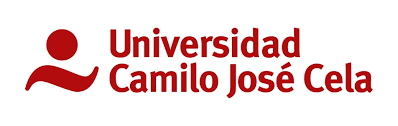



**ÍNDICE DE CONTENIDOS**

1. [Instrucciones de la prueba](#topic1)
2. [Bloque 1: Ejercicios básicos de la prueba](#topic2)
3. [Bloque 2: Ejercicios intermedios de la prueba](#topic3)
4. [Bloque 3: Ejercicio avanzado de la prueba](#topic4)

---

# Instrucciones de la prueba <a id="topic1"></a><a href="#index"><i class="fa fa-list-alt" aria-hidden="true"></i></a>

Este notebook corresponde a la <u>prueba de evaluación continua</u> de la asignatura de Aprendizaje Profundo. El peso de la misma corresponde al **40% de la nota final** de la asignatura. Se establecen los siguientes tres niveles de evaluación por bloques de dificultad:

1. Básico: el alumno es capaz de realizar tareas, ejercicios o prácticas similares a las realizadas durante la asignatura.
2. Intermedio: el alumno es capaz de aplicar las técnicas, conocimientos y habilidades vistas en clase a problemas con elementos diferentes.
3. Avanzado: el alumno es capaz de ampliar las técnicas, conocimientos y habilidades vistas en clase, investigando nuevos aspectos o problemas.

Las calificaciones, por tanto, serán coherentes al nivel alcanzado. Cada alumno deberá de entregar este mismo notebook con sus respuestas a través de la plataforma **Blackboard** llamando al archivo **PEC_ApellidosNombre**. La fecha límite de envío será el **03 de abril de 2024 (23:59h Madrid)**. El profesor publicará las calificaciones con posterioridad. ¡Mucha suerte y ánimo a tod@s!

**<mark>Nota.-**<mark><div style="background-color:#F7DC6F"><b>Tened en cuenta que deberéis de aportar respuestas detalladas y bien justificadas. No es admisible adjuntar únicamente el código sin comentar. Hay que incluir paso a paso lo que estáis haciendo en las propias celdas de código. Además, deberéis de razonar, argumentar e interpretar los resultados obtenidos utilizando para ello celdas tipo Markdown. </b></div>

# Bloque 1: Ejercicios básicos de la prueba <a id="topic2"></a>&nbsp;&nbsp;<a href="#index"><i class="fa fa-list-alt" aria-hidden="true"></i></a>

### 01 Ejercicio [1 punto]

Considerar la estructura de una red neuronal convolucional compuesta por cinco capas convolucionales, las dos primeras con filtros de $3x3$ y un paso de avance de $2$. Las otras tres, utilizarán un detector de rasgos de $5x5$. La primera capa genera como salida $100$ mapas de características, la segunda genera $200$, la tercera $300$, la cuarta $400$ y la superior $500$ mapas de características. Las imágenes de entrada son imágenes RGB ($3$ canales) de $128x128$ píxeles. Realizar los siguientes apartados:

1. Explicar el procedimiento de una capa de convolución y su utilidad.
2. Explicar el procedimiento de una capa de max-pooling y su utilidad.
3. Explicar el procedimiento de una capa de flatten y su utilidad.
4. ¿Cuál sería el número total de parámetros que tendríamos que estimar en el caso expuesto? Argumentar los cálculos realizados.
5. Realizar una representación espacial de la arquitectura de la red neuronal de convolución propuesta. Incluir el diagrama generado y explicarlo.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 01</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1: Explicar el procedimiento de una capa de convolución y su utilidad</b></div>


Una capa de convolución aplica muchos filtros a la entrada de la capa (una imágen por ejemplo) para poder obtener las características principales de dicha entrada, para posteriormente dotar del modelo la capacidad de reconocer, por ejemplo, si la imagen que se le ha pasado es de un perro o un gato reconociendo patrones de la foto.


En la capa de convolución se utiliza una variedad de filtros sobre una imagen, lo cual resulta en la utilidad de conseguir un mapa de características que identifican dicha imagen con rasgos propios. Algunos de estos filtros son sharpen, blur, edge enhance, edge detect o emboss.

El siguiente paso, tras conseguir los mapas de características de las imágenes que se esten utilizando para entrenar el modelo, sería pasar el resultado de las capas de convolución por una capa ReLU, la cual elimina los valores por debajo de cero, lo que permite identificar con mayor facilidad las principales características de la imagen.

<div style="background-color:#5DADE2"><b>Apartado 2: Explicar el procedimiento de una capa de max-pooling y su utilidad</b></div>

La capa de max-pooling se encarga de reducir la dimensionalidad de los mapas de características obtenidos en el paso anterior.

Para ello, la capa de max-pooling agrupa la información entre píxeles cercanos. Estos píxeles cercanos son delimitados por una ventana. La capa tan solo guardará el dato del píxel con mayor valor, preservando los valores máximos de la figura original en posiciones muy parecidas.

La utilidad de esta capa por tanto es reducir los costes computacionales, debido a que se esta comprimiendo la información original, y ayudar a que el modelo generalice mejor, ya que estas capas comprimidas ayuda a este a poder identificar las características de las entradas aunque, por ejemplo, un animal esté en diferentes posiciones. El modelo debería de ser capaz de reconocer a un perro sea cual sea su posición, tamaño o color, entre otras características.

<div style="background-color:#5DADE2"><b>Apartado 3: Explicar el procedimiento de una capa de flatten y su utilidad</b></div>

La utilidad de la capa de flatten es preparar los datos obtenidos en la capa de max-pooling para ser utilizados posteriormente como capas de entrada en una RNA (red neuronal artificial).

Para ello, la capa de flatten convierte el resultado del max-pooling a un vector unidimensional, perdiendo la estructura, pero manteniendo la relación entre los elementos.

<div style="background-color:#5DADE2"><b>Apartado 4 - ¿Cuál sería el número total de parámetros que tendríamos que estimar en el caso expuesto? Argumentar los cálculos realizados</b></div>

Para poder calcular el número total de los parámetros, habría que hacer lo siguiente por cada capa:

1 - Saber que dimensiones tiene, en este caso, la primera tiene 3x3, además de ser RGB, por lo que tiene 3 capas de color. Además la salida será de 100 mapas de características.

2 - Multiplicar todos estos datos, es decir, 3 x 3 x 3 x 100, lo que da 2700 parámetros para la primera capa de convolución.

3 - Para las siguientes capas ya no hay que tener en cuenta el RGB, si no el número de mapas de características que saca la capa de convolución. Por ejemplo para la segunda capa, el cálculo sería 3 x 3 x 100 x 200, donde 100 son los mapas de características resultantes de la primera capa de convolución, y 200 son las capas que esta segunda capa de convolución devolverá. El proceso es el mismo para las siguientes capas.

En el siguiente código se puede observar como se ha calculado:

In [ ]:
# 1º Capa
# Filtro de 3x3, RBG
parametros_c1 = 3 * 3 * 3
# 100 mapas de caracteristicas
mc_c1 = 100
parametros_c1 *= mc_c1

print("La capa 1 tiene", parametros_c1, "parámetros")

# 2º Capa
# Filtro de 3x3, su entrada son los mapas de caracteristicas de la capa anterior (100)
parametros_c2 = 3 * 3 * mc_c1
# 200 mapas de caracteristicas
mc_c2 = 200
parametros_c2 *= mc_c2

print("La capa 2 tiene", parametros_c2, "parámetros")

# 3º Capa
# Filtro de 5x5, su entrada son los mapas de caracteristicas de la capa anterior (200)
parametros_c3 = 5 * 5 * mc_c2
# 200 mapas de caracteristicas
mc_c3 = 300
parametros_c3 *= mc_c3

print("La capa 3 tiene", parametros_c3, "parámetros")

# 4º Capa
# Filtro de 5x5, su entrada son los mapas de caracteristicas de la capa anterior (300)
parametros_c4 = 5 * 5 * mc_c3
# 200 mapas de caracteristicas
mc_c4 = 400
parametros_c4 *= mc_c4

print("La capa 4 tiene", parametros_c4, "parámetros")

# 5º Capa
# Filtro de 5x5, su entrada son los mapas de caracteristicas de la capa anterior (400)
parametros_c5 = 5 * 5 * mc_c4
# 200 mapas de caracteristicas
mc_c5 = 500
parametros_c5 *= mc_c5

print("La capa 5 tiene", parametros_c5, "parámetros","\n")

print("El total de parámetros es:", parametros_c1 + parametros_c2 + parametros_c3 + parametros_c4 + parametros_c5)


La capa 1 tiene 2700 parámetros
La capa 2 tiene 180000 parámetros
La capa 3 tiene 1500000 parámetros
La capa 4 tiene 3000000 parámetros
La capa 5 tiene 5000000 parámetros 

El total de parámetros es: 9682700


<div style="background-color:#5DADE2"><b>Apartado 5: Realizar una representación espacial de la arquitectura de la red neuronal de convolución propuesta. Incluir el diagrama generado y explicarlo</b></div>

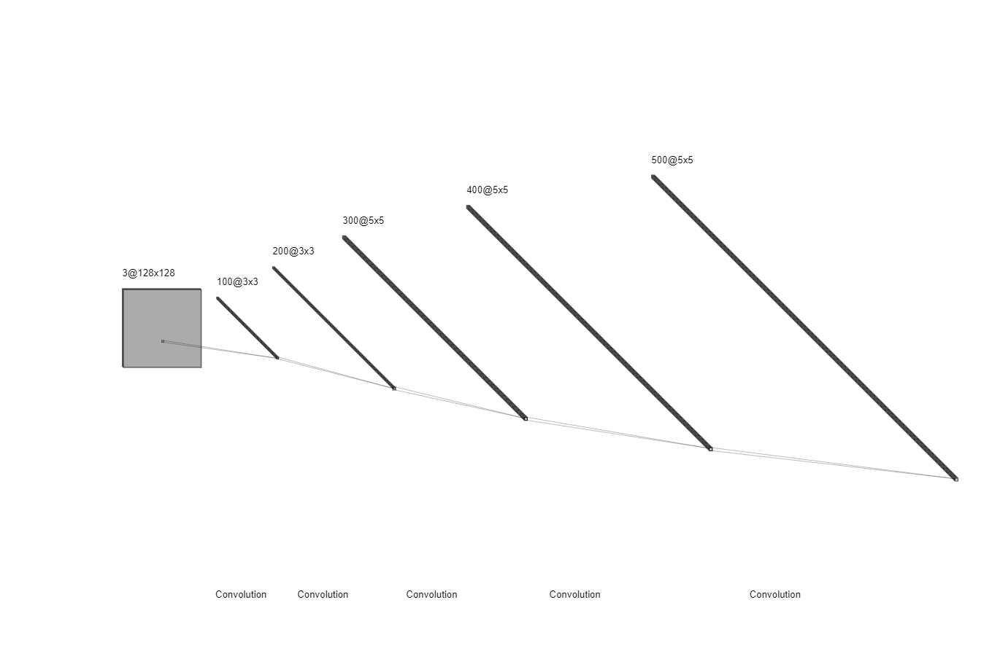

El diagrama representa la estructura propuesta por el enunciado, donde primero se encuentran las imágenes de entrada de 128x128 de 3 capas, y las 5 capas de convolución, donde la primera tiene 100 mapas de carácteristicas con un tamaño de filtro de 3x3, la segunda 200 de 3x3, la tercera 300 de 5x5, la cuarta 400 de 5x5 y la última 500 de 5x5

### 02 Ejercicio [2 puntos]

En este ejercicio se plantea un **problema de regresión multivariante** de pérdida de clientes de un banco. Podéis tomar como punto de partida el caso visto en el Notebook '$2.2$ Cómo programar una Red Neuronal Artificial' del Tema $2$. Partiendo del mismo conjunto de datos de clientes del banco (*Churn_Modelling.csv*), el objetivo será proponer, al menos, tres arquitecturas de redes neuronales multicapa diferentes **para cada uno** de los siguientes casos:

+ Escenario $1$: Entrenamiento $1000$ observaciones y Testing $200$ observaciones

+ Escenario $2$: Entrenamiento $4000$ observaciones y Testing $1000$ observaciones

+ Escenario $3$: Entrenamiento $8000$ observaciones y Testing $2000$ observaciones

Tener en cuenta que tendréis que crear nuevos dataset a partir del dado para cada uno de los escenarios mencionados. Recordar que las fases básicas para implementar un algoritmo de aprendizaje profundo son las siguientes:

1. Pre-procesado datos entrada red neuronal multicapa
2. Definición de la arquitectura red neuronal multicapa
3. Configuración del proceso de aprendizaje de la red neuronal multicapa
4. Entrenamiento del modelo de red neuronal multicapa
5. Evaluación del modelo y cálculo de métricas de clasificación (precisión,    recall, f1-score, matriz de confusión y área curva ROC)

**Nota.** En este ejercicio NO podéis aplicar mejoras propias del proceso de entrenamiento. Todas las alternativas que propongáis tienen que ser exclusivamente relacionadas con cambios en los hiperparámetros del diseño de la arquitectura de la red y del proceso de compilación. NO del entrenamiento. Tampoco se pueden utilizar ni la técnica de validación cruzada ni la técnica de grid_search.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 02</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1 - Pre-procesado datos entrada red neuronal multicapa</b></div>

El primer paso en el pre-procesado de los datos es importar los paquetes necesarios para ello, en este caso numpy, pandas y drive, este último permitiendo el importado de los datos:

In [ ]:
# Importado de paquetes necesarios
import numpy as np
import pandas as pd

In [ ]:
# Conexión del notebook con drive para obtener los datos
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Obtención y visualización de los datos
dataset = pd.read_csv('drive/MyDrive/Master/AP/T2/Churn_Modelling.csv')
dataset.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


Tras esto, se separará el dataset en dos, en variables independientes, y dependiente, siendo esta última la columna "IsActiveMember", que indica si la persona sigue en el banco, o ha dejado de estarlo

Esta separación deja fuera las primeras 3 columnas, las cuales no contienen información útil que incluir en los datasets de entrenamiento de las RNAs:

In [ ]:
# Variables independientes, con los que se entrenará y validará el modelo
x = dataset.iloc[:, 3:13].values

# Variable dependiente
y = dataset.iloc[:, 13].values

In [ ]:
# Visualización de las variables independientes para comprobar que la separación se ha realizado correctamente
x

array([[619, 'France', 'Female', ..., 1, 1, 101348.88],
       [608, 'Spain', 'Female', ..., 0, 1, 112542.58],
       [502, 'France', 'Female', ..., 1, 0, 113931.57],
       ...,
       [709, 'France', 'Female', ..., 0, 1, 42085.58],
       [772, 'Germany', 'Male', ..., 1, 0, 92888.52],
       [792, 'France', 'Female', ..., 1, 0, 38190.78]], dtype=object)

Ahora hay que codificar las variables categóricas. Esto se debe a que las redes neuronales que se van a crear, no se adaptan a este tipo de variables. Hay otro tipo de redes que si que las aceptan, pero de momento se va a recurrir a la codificación de dichas variables.

La primera columna que se va a cambiar es la de "Gender", que contiene el sexo de cada cliente. Para etiquetar esta columna, se va a utilizar la función "LabelEncoder", que cambia variables binarias de texto a ceros y unos (mujer y hombre respectivamente). Se aplica de la siguiente forma:

In [ ]:
# Codificación de variables categóricas
from sklearn.preprocessing import LabelEncoder

# Columna Gender
labelencoder_gender = LabelEncoder()
x[:, 2] = labelencoder_gender.fit_transform(x[:, 2])
x

array([[619, 'France', 0, ..., 1, 1, 101348.88],
       [608, 'Spain', 0, ..., 0, 1, 112542.58],
       [502, 'France', 0, ..., 1, 0, 113931.57],
       ...,
       [709, 'France', 0, ..., 0, 1, 42085.58],
       [772, 'Germany', 1, ..., 1, 0, 92888.52],
       [792, 'France', 0, ..., 1, 0, 38190.78]], dtype=object)

El siguietne paso es la columna "Geography", que indica de donde procede cada cliente. Esta columna no es binaria como el anterior caso como se puede ver en la siguiente celda:

In [ ]:
np.unique(x[:, 1])

array(['France', 'Germany', 'Spain'], dtype=object)

Debido a esto, no se puede utilizar la misma función que en el anterior caso. Se tiene que utilizar ColumnTransformer y OneHotEncoder, ambas funciones de sklearn.

ColumnTransformer nos permite realizar cambios en columnas específicas, en este caso, la segunda columna "Geography". OneHotEncoder permite cambiar variables categóricas a variables binarias (0 y 1). Lo especial de este caso es que se crearán tres columnas, donde cada columna corresponde a un país, y donde 1 significa que el cliente es de dicho país.

In [ ]:
# Columna geography
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

transformer = ColumnTransformer(
    transformers=[
        ("Churn_Modelling",        # Un nombre de la transformación
         OneHotEncoder(categories='auto'), # La clase a la que transformar
         [1]            # Las columnas a transformar.
         )
    ], remainder='passthrough' # Se señala a través de este parámetro que todas las demás columnas no se transforman
)

x = transformer.fit_transform(x) # Se aplica el transformer creado

# Se comprueba que se ha realizado correctamente
x[:, 0:5]

array([[1.0, 0.0, 0.0, 619, 0],
       [0.0, 0.0, 1.0, 608, 0],
       [1.0, 0.0, 0.0, 502, 0],
       ...,
       [1.0, 0.0, 0.0, 709, 0],
       [0.0, 1.0, 0.0, 772, 1],
       [1.0, 0.0, 0.0, 792, 0]], dtype=object)

El siguiente paso es separar los datos en conjuntos de train y test. Se separará en tres conjuntos, uno para cada caso:

In [ ]:
# Separar en train y test las variables independientes
from sklearn.model_selection import train_test_split

# Escenario 1 - Train de tamaño 1000 y test de tamaño 200
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(x, y, train_size=1000, test_size=200, random_state = 0)

# Escenario 2 - Train de tamaño 4000 y test de tamaño 1000
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(x, y, train_size=4000, test_size=1000, random_state = 0)

# Escenario 3 - Train de tamaño 8000 y test de tamaño 2000
x_train_3, x_test_3, y_train_3, y_test_3 = train_test_split(x, y, train_size=8000, test_size=2000, random_state = 0)

El último paso del preprocesado es el escalado de variables. Esto permitirá que las RNAs entrenen de manera más eficiente. Para ello se va a utilizar el método StandardScaler del paquete sklearn:

In [ ]:
# Escalado de variables para el mejor funcionamiente de las RNAs

# Creación de los objetos que normalizarán las variables
from sklearn.preprocessing import StandardScaler
sc_x1 = StandardScaler()
sc_x2 = StandardScaler()
sc_x3 = StandardScaler()

# Entrenamiento y aplicado del escalador sobre las variables independientes
x_train_1 = sc_x1.fit_transform(x_train_1)
x_test_1 = sc_x1.transform(x_test_1)

x_train_2 = sc_x2.fit_transform(x_train_2)
x_test_2 = sc_x2.transform(x_test_2)

x_train_3 = sc_x3.fit_transform(x_train_3)
x_test_3 = sc_x3.transform(x_test_3)

<div style="background-color:#5DADE2"><b>Apartado 2 - Definición de la arquitectura red neuronal multicapa</b></div>

- La capa de entrada contará con 11 capas de entrada, ya que el dataset contiene 11 variables independientes.

- El número de nodos en la capa oculta será de (12 + 1)/2, (12 por las variables independientes, 1 por el nodo de salida). Habrán 7 nodos en la capa oculta.

- Como función de activación, se utilizará el Rectificador Lineal Unitario RELU


Se crearán tres redes para cada caso, que serán estructuradas de la siguiente forma:

1ª estructura:
- La red neuronal contará con dos capas ocultas, ambas con el mismo número de nodos (6).

- Como capa de salida se va a utilizar la sigmoide, que convertirá los pesos procesados por la RNA a probabilidades, en este caso, que un cliente abandone el banco.

- Como optimizador se va a utilizar la versión mejorada del Gradiente Descendente Estocástico, el optimizador ADAM.

- Como función de costes, se va a utilizar el BCE, ya que este caso es un clasificador binario

- Como métrica de rendimiento, se va a utilizar la precisión.

2ª estructura:

- Misma estructura, pero se añade una tercera capa oculta de 16 nodos.

3ª estructura:

- Misma estructura que la anterior, pero la tercera capa oculta constará de 32 nodos y se realizarán 200 epochs en vez de 100.

La intención de estas estructuras es comprobar cuanta mejora se puede conseguir añadiendo ligeros cambios. Estas 3 estructuras se repetirán en los 3 casos, lo que va a permitir saber si es positivo entrenar a la red con más datos, y si cambiar la estructura es positivo.

A continuación se va a contruir la RNA con las características dichas:

<div style="background-color:#5DADE2"><b>Apartado 3 - Configuración del proceso de aprendizaje de la red neuronal multicapa</b></div>

A continuación se va a programar la estructura anteriormente propuesta. El primer paso es importar los paquetes necesarios:

In [ ]:
import keras
from keras.models import Sequential # Variable inicializadora de la RNA
from keras.layers import Dense # Capas ocultas

Ahora se programarán las redes neuronales con la estructura mencionada en el apartado anterior:

In [ ]:
# Caso 1_1
rna1_1 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna1_1.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna1_1.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna1_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna1_1.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 1_2
rna1_2 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna1_2.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna1_2.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna1_2.add(Dense(units = 16, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna1_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna1_2.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 1_3
rna1_3 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna1_3.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna1_3.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna1_3.add(Dense(units = 32, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna1_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna1_3.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [ ]:
# Caso 2_1
rna2_1 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna2_1.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna2_1.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna2_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna2_1.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 2_2
rna2_2 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna2_2.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna2_2.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna2_2.add(Dense(units = 16, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna2_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna2_2.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 2_3
rna2_3 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna2_3.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna2_3.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna2_3.add(Dense(units = 32, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna2_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna2_3.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [ ]:
# Caso 3_1
rna3_1 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna3_1.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna3_1.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna3_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna3_1.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 3_2
rna3_2 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna3_2.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna3_2.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna3_2.add(Dense(units = 16, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna3_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna3_2.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])


# Caso 3_3
rna3_3 = Sequential() # Se inicializa la red neuronal

# Entrada y primera capa oculta
rna3_3.add(Dense(units = 6, kernel_initializer = "uniform", activation = "relu", input_dim = 12))

# Segunda capa oculta
rna3_3.add(Dense(units = 6, kernel_initializer = "uniform",  activation = "relu"))

# Tercera capa oculta
rna3_3.add(Dense(units = 32, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rna3_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

# Compilación de la RNA
rna3_3.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

<div style="background-color:#5DADE2"><b>Apartado 4 - Entrenamiento del modelo de red neuronal multicapa</b></div>

Ahora con todas las redes creadas y compiladas, se puede pasar a entrenarlas de la siguiente forma:

In [ ]:
# Caso 1_1
rna1_1.fit(x_train_1, y_train_1,  batch_size = 10, epochs = 100)

Epoch 1/100
100/100 [==============================] - 3s 3ms/step - loss: 0.6739 - accuracy: 0.7840
Epoch 2/100
100/100 [==============================] - 0s 4ms/step - loss: 0.5871 - accuracy: 0.7920
Epoch 3/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4700 - accuracy: 0.7920
Epoch 4/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4411 - accuracy: 0.7920
Epoch 5/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4338 - accuracy: 0.7920
Epoch 6/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4291 - accuracy: 0.7920
Epoch 7/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4254 - accuracy: 0.7920
Epoch 8/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4230 - accuracy: 0.7920
Epoch 9/100
100/100 [==============================] - 0s 4ms/step - loss: 0.4209 - accuracy: 0.7920
Epoch 10/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4187 - accura

In [ ]:
# Caso 1_2
rna1_2.fit(x_train_1, y_train_1,  batch_size = 10, epochs = 100)

Epoch 1/100
100/100 [==============================] - 2s 3ms/step - loss: 0.6578 - accuracy: 0.7910
Epoch 2/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7920
Epoch 3/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7920
Epoch 4/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7920
Epoch 5/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7920
Epoch 6/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7920
Epoch 7/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7920
Epoch 8/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.7920
Epoch 9/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.7920
Epoch 10/100
100/100 [==============================] - 0s 3ms/step - loss: 0.4185 - accura

In [ ]:
# Caso 1_3
rna1_3.fit(x_train_1, y_train_1,  batch_size = 10, epochs = 200)

Epoch 1/200
100/100 [==============================] - 2s 3ms/step - loss: 0.6494 - accuracy: 0.7870
Epoch 2/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7920
Epoch 3/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7920
Epoch 4/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7920
Epoch 5/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7920
Epoch 6/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7920
Epoch 7/200
100/100 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7920
Epoch 8/200
100/100 [==============================] - 0s 4ms/step - loss: 0.4234 - accuracy: 0.7920
Epoch 9/200
100/100 [==============================] - 0s 4ms/step - loss: 0.4216 - accuracy: 0.7920
Epoch 10/200
100/100 [==============================] - 0s 4ms/step - loss: 0.4189 - accura

In [ ]:
# Caso 2_1
rna2_1.fit(x_train_2, y_train_2,  batch_size = 10, epochs = 100)

Epoch 1/100
400/400 [==============================] - 2s 3ms/step - loss: 0.5362 - accuracy: 0.7925
Epoch 2/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4351 - accuracy: 0.7930
Epoch 3/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4266 - accuracy: 0.8120
Epoch 4/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4210 - accuracy: 0.8213
Epoch 5/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4171 - accuracy: 0.8267
Epoch 6/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4139 - accuracy: 0.8303
Epoch 7/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4111 - accuracy: 0.8303
Epoch 8/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4086 - accuracy: 0.8313
Epoch 9/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4061 - accuracy: 0.8332
Epoch 10/100
400/400 [==============================] - 2s 4ms/step - loss: 0.4050 - accura

In [ ]:
# Caso 2_2
rna2_2.fit(x_train_2, y_train_2,  batch_size = 10, epochs = 100)

Epoch 1/100
400/400 [==============================] - 2s 3ms/step - loss: 0.5118 - accuracy: 0.7930
Epoch 2/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4388 - accuracy: 0.7930
Epoch 3/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4352 - accuracy: 0.7930
Epoch 4/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4321 - accuracy: 0.7930
Epoch 5/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4303 - accuracy: 0.7930
Epoch 6/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4276 - accuracy: 0.8005
Epoch 7/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4262 - accuracy: 0.8102
Epoch 8/100
400/400 [==============================] - 1s 4ms/step - loss: 0.4240 - accuracy: 0.8188
Epoch 9/100
400/400 [==============================] - 2s 4ms/step - loss: 0.4230 - accuracy: 0.8190
Epoch 10/100
400/400 [==============================] - 1s 3ms/step - loss: 0.4193 - accura

In [ ]:
# Caso 2_3
rna2_3.fit(x_train_2, y_train_2,  batch_size = 10, epochs = 200)

Epoch 1/200
400/400 [==============================] - 3s 3ms/step - loss: 0.5035 - accuracy: 0.7905
Epoch 2/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4375 - accuracy: 0.7930
Epoch 3/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4307 - accuracy: 0.7930
Epoch 4/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4267 - accuracy: 0.7993
Epoch 5/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4232 - accuracy: 0.8223
Epoch 6/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4199 - accuracy: 0.8253
Epoch 7/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4184 - accuracy: 0.8273
Epoch 8/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4165 - accuracy: 0.8282
Epoch 9/200
400/400 [==============================] - 1s 3ms/step - loss: 0.4157 - accuracy: 0.8298
Epoch 10/200
400/400 [==============================] - 2s 4ms/step - loss: 0.4136 - accura

In [ ]:
# Caso 3
rna3_1.fit(x_train_3, y_train_3,  batch_size = 10, epochs = 100)

Epoch 1/100
800/800 [==============================] - 4s 3ms/step - loss: 0.4833 - accuracy: 0.7954
Epoch 2/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4274 - accuracy: 0.7960
Epoch 3/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4214 - accuracy: 0.7997
Epoch 4/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4180 - accuracy: 0.8242
Epoch 5/100
800/800 [==============================] - 3s 3ms/step - loss: 0.4152 - accuracy: 0.8276
Epoch 6/100
800/800 [==============================] - 3s 3ms/step - loss: 0.4127 - accuracy: 0.8336
Epoch 7/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4089 - accuracy: 0.8326
Epoch 8/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4070 - accuracy: 0.8335
Epoch 9/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4053 - accuracy: 0.8339
Epoch 10/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4034 - accura

In [ ]:
# Caso 3_2
rna3_2.fit(x_train_3, y_train_3,  batch_size = 10, epochs = 100)

Epoch 1/100
800/800 [==============================] - 4s 3ms/step - loss: 0.4779 - accuracy: 0.7960
Epoch 2/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4290 - accuracy: 0.7960
Epoch 3/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4223 - accuracy: 0.8142
Epoch 4/100
800/800 [==============================] - 3s 4ms/step - loss: 0.4187 - accuracy: 0.8217
Epoch 5/100
800/800 [==============================] - 3s 3ms/step - loss: 0.4164 - accuracy: 0.8274
Epoch 6/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4141 - accuracy: 0.8292
Epoch 7/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4129 - accuracy: 0.8310
Epoch 8/100
800/800 [==============================] - 2s 3ms/step - loss: 0.4114 - accuracy: 0.8332
Epoch 9/100
800/800 [==============================] - 3s 4ms/step - loss: 0.4109 - accuracy: 0.8324
Epoch 10/100
800/800 [==============================] - 3s 4ms/step - loss: 0.4100 - accura

In [ ]:
# Caso 3_3
rna3_3.fit(x_train_3, y_train_3,  batch_size = 10, epochs = 200)

Epoch 1/200
800/800 [==============================] - 4s 3ms/step - loss: 0.4711 - accuracy: 0.7959
Epoch 2/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4263 - accuracy: 0.7999
Epoch 3/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4212 - accuracy: 0.8161
Epoch 4/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4187 - accuracy: 0.8257
Epoch 5/200
800/800 [==============================] - 3s 3ms/step - loss: 0.4156 - accuracy: 0.8299
Epoch 6/200
800/800 [==============================] - 3s 4ms/step - loss: 0.4109 - accuracy: 0.8309
Epoch 7/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4060 - accuracy: 0.8330
Epoch 8/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4047 - accuracy: 0.8349
Epoch 9/200
800/800 [==============================] - 2s 3ms/step - loss: 0.4038 - accuracy: 0.8344
Epoch 10/200
800/800 [==============================] - 3s 3ms/step - loss: 0.4031 - accura

<div style="background-color:#5DADE2"><b>Apartado 5 - Evaluación del modelo y cálculo de métricas de clasificación (precisión, recall, f1-score, matriz de confusión y área curva ROC)</b></div>

Para evaluar las RNAs, se van a utilizar las métricas sugeridas por el enunciado. Para utilizar estas, habrá que importar los paquetes necesarios de sklearn como se puede ver a continuación.

Después, se realizarán predicciones usando cada RNA sobre el conjunto de test, para poder comparar los resultados de este conjunto con el de entrenamiento.

Posterior a esto, se usará el conjunto de y_test (que contiene lo que debería dar las predicciones anteriormente realizadas con el conjunto de x_test) en los métodos de accuracy, precision, recall, f1, confusion matrix y roc_auc:

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.metrics import roc_curve, auc

In [ ]:
# CASO 1_1
# Predicciones en el conjunto de prueba
y_pred_11 = rna1_1.predict(x_test_1)
y_pred_binary_11 = (y_pred_11 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_1, y_pred_binary_11)
precision = precision_score(y_test_1, y_pred_binary_11)
recall = recall_score(y_test_1, y_pred_binary_11)
f1 = f1_score(y_test_1, y_pred_binary_11)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_1, y_pred_binary_11)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_1, y_pred_11)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_1, y_pred_11)
roc_auc_curve = auc(fpr, tpr)


print("CASO 1_1:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# CASO 1_2
# Predicciones en el conjunto de prueba
y_pred_12 = rna1_2.predict(x_test_1)
y_pred_binary_12 = (y_pred_12 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_1, y_pred_binary_12)
precision = precision_score(y_test_1, y_pred_binary_12)
recall = recall_score(y_test_1, y_pred_binary_12)
f1 = f1_score(y_test_1, y_pred_binary_12)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_1, y_pred_binary_12)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_1, y_pred_12)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_1, y_pred_12)
roc_auc_curve = auc(fpr, tpr)


print("CASO 1_2:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# CASO 1_3
# Predicciones en el conjunto de prueba
y_pred_13 = rna1_3.predict(x_test_1)
y_pred_binary_13 = (y_pred_13 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_1, y_pred_binary_13)
precision = precision_score(y_test_1, y_pred_binary_13)
recall = recall_score(y_test_1, y_pred_binary_13)
f1 = f1_score(y_test_1, y_pred_binary_13)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_1, y_pred_binary_13)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_1, y_pred_13)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_1, y_pred_13)
roc_auc_curve = auc(fpr, tpr)


print("CASO 1_3:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)

7/7 [==============================] - 0s 2ms/step
CASO 1_1: 

Accuracy: 0.855
Precision: 0.7878787878787878
Recall: 0.5416666666666666
F1 Score: 0.6419753086419753
Confusion Matrix:
 [[145   7]
 [ 22  26]]
ROC AUC Score: 0.9146107456140351 

7/7 [==============================] - 0s 2ms/step
CASO 1_2: 

Accuracy: 0.79
Precision: 0.5833333333333334
Recall: 0.4375
F1 Score: 0.5
Confusion Matrix:
 [[137  15]
 [ 27  21]]
ROC AUC Score: 0.8098958333333334 

7/7 [==============================] - 0s 2ms/step
CASO 1_3: 

Accuracy: 0.8
Precision: 0.6538461538461539
Recall: 0.3541666666666667
F1 Score: 0.4594594594594595
Confusion Matrix:
 [[143   9]
 [ 31  17]]
ROC AUC Score: 0.8527275219298246


El resultado del primer grupo de redes es generalmente buena, pero muy mejorable, siendo la mejor red la primera. Esto nos indica que no siempre más es mejor, ya que es muy fácil caer en overfitting, y que aunque se consiga un buen resultado en el conjunto de entrenamiento, no se consiga un buen resultado en el conjunto de test.

Otra posibilidad de porque es mejor una red más simple en este caso, es que hay muy poca información para entrenar a la red neuronal. En estos casos, mayoritariamente tener más capas es peor para el rendimiento de la capa de validación.

In [ ]:
# CASO 2_1

# Predicciones en el conjunto de prueba
y_pred_21 = rna2_1.predict(x_test_2)
y_pred_binary_21 = (y_pred_21 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_2, y_pred_binary_21)
precision = precision_score(y_test_2, y_pred_binary_21)
recall = recall_score(y_test_2, y_pred_binary_21)
f1 = f1_score(y_test_2, y_pred_binary_21)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_2, y_pred_binary_21)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_2, y_pred_21)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_2, y_pred_21)
roc_auc_curve = auc(fpr, tpr)


print("CASO 2_1:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# CASO 2_2

# Predicciones en el conjunto de prueba
y_pred_22 = rna2_2.predict(x_test_2)
y_pred_binary_22 = (y_pred_22 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_2, y_pred_binary_22)
precision = precision_score(y_test_2, y_pred_binary_22)
recall = recall_score(y_test_2, y_pred_binary_22)
f1 = f1_score(y_test_2, y_pred_binary_22)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_2, y_pred_binary_22)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_2, y_pred_22)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_2, y_pred_22)
roc_auc_curve = auc(fpr, tpr)


print("CASO 2_2:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# CASO 2_3

# Predicciones en el conjunto de prueba
y_pred_23 = rna2_3.predict(x_test_2)
y_pred_binary_23 = (y_pred_23 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_2, y_pred_binary_23)
precision = precision_score(y_test_2, y_pred_binary_23)
recall = recall_score(y_test_2, y_pred_binary_23)
f1 = f1_score(y_test_2, y_pred_binary_23)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_2, y_pred_binary_23)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_2, y_pred_23)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_2, y_pred_23)
roc_auc_curve = auc(fpr, tpr)


print("CASO 2_3:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")

32/32 [==============================] - 0s 2ms/step
CASO 2_1: 

Accuracy: 0.861
Precision: 0.7218543046357616
Recall: 0.529126213592233
F1 Score: 0.6106442577030813
Confusion Matrix:
 [[752  42]
 [ 97 109]]
ROC AUC Score: 0.8627754273556528 

32/32 [==============================] - 0s 2ms/step
CASO 2_2: 

Accuracy: 0.837
Precision: 0.7263157894736842
Recall: 0.33495145631067963
F1 Score: 0.4584717607973422
Confusion Matrix:
 [[768  26]
 [137  69]]
ROC AUC Score: 0.8013560441172874 

32/32 [==============================] - 0s 2ms/step
CASO 2_3: 

Accuracy: 0.836
Precision: 0.6944444444444444
Recall: 0.3640776699029126
F1 Score: 0.4777070063694267
Confusion Matrix:
 [[761  33]
 [131  75]]
ROC AUC Score: 0.8037037489912207 



Este caso es bastante diferente al anterior, ya que se entrena a la red con más datos, por lo que los resultados de las diferentes estructuras se iguala más. En lo general, sigue siendo mejor la primera estructura, ya que es la que mejores métricas ha obtenido, pero al contrario que el caso anterior, la diferencia es relativamente poca entre redes.

In [ ]:
# Caso 3_1

# Predicciones en el conjunto de prueba
y_pred_31 = rna3_1.predict(x_test_3)
y_pred_binary_31 = (y_pred_31 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_3, y_pred_binary_31)
precision = precision_score(y_test_3, y_pred_binary_31)
recall = recall_score(y_test_3, y_pred_binary_31)
f1 = f1_score(y_test_3, y_pred_binary_31)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_3, y_pred_binary_31)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_3, y_pred_31)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_3, y_pred_31)
roc_auc_curve = auc(fpr, tpr)

print("CASO 3_1:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# Caso 3_2

# Predicciones en el conjunto de prueba
y_pred_32 = rna3_2.predict(x_test_3)
y_pred_binary_32 = (y_pred_32 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_3, y_pred_binary_32)
precision = precision_score(y_test_3, y_pred_binary_32)
recall = recall_score(y_test_3, y_pred_binary_32)
f1 = f1_score(y_test_3, y_pred_binary_32)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_3, y_pred_binary_32)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_3, y_pred_32)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_3, y_pred_32)
roc_auc_curve = auc(fpr, tpr)

print("CASO 3_2:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")



# Caso 3_3

# Predicciones en el conjunto de prueba
y_pred_33 = rna3_3.predict(x_test_3)
y_pred_binary_33 = (y_pred_33 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(y_test_3, y_pred_binary_33)
precision = precision_score(y_test_3, y_pred_binary_33)
recall = recall_score(y_test_3, y_pred_binary_33)
f1 = f1_score(y_test_3, y_pred_binary_33)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test_3, y_pred_binary_33)

# Área bajo la curva ROC
roc_auc = roc_auc_score(y_test_3, y_pred_33)

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test_3, y_pred_33)
roc_auc_curve = auc(fpr, tpr)

print("CASO 3_3:", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)

63/63 [==============================] - 0s 2ms/step
CASO 3_1: 

Accuracy: 0.8555
Precision: 0.6757575757575758
Recall: 0.5506172839506173
F1 Score: 0.6068027210884354
Confusion Matrix:
 [[1488  107]
 [ 182  223]]
ROC AUC Score: 0.8604435156159295 

63/63 [==============================] - 0s 2ms/step
CASO 3_2: 

Accuracy: 0.843
Precision: 0.7570621468926554
Recall: 0.3308641975308642
F1 Score: 0.4604810996563574
Confusion Matrix:
 [[1552   43]
 [ 271  134]]
ROC AUC Score: 0.7960493827160493 

63/63 [==============================] - 0s 2ms/step
CASO 3_3: 

Accuracy: 0.844
Precision: 0.694560669456067
Recall: 0.40987654320987654
F1 Score: 0.5155279503105591
Confusion Matrix:
 [[1522   73]
 [ 239  166]]
ROC AUC Score: 0.8033391385115523


Ahora, entrenando a la red con todos los datos posibles, se ha igualado todavía más los rendim,ientos de los modelos. Se pueden destacar el primero y el tercero, aunque no se puede definir cual es mejor que otro, ya que por ejemplo la primera red obtiene mayor puntuación de accuracy, pero la tercera obtiene mejor precisión, por lo que habría que elegir red dependiendo de las necesidades que tenga que cubrir dicha red.

### 03 Ejercicio [2 puntos]

En este ejercicio se plantea un **problema de clasificación binaria** de imágenes de animales. Podéis tomar como punto de partida el caso visto en el Notebook '$3.2$ Cómo programar una Red Neuronal de Convolución' del Tema $3$. Partiendo del mismo conjunto de datos de imágenes de perros y gatos (*dataset*), el objetivo será proponer, al menos, tres arquitecturas de redes neuronales multicapa diferentes **para cada uno** de los siguientes casos:

+ Escenario $1$: Entrenamiento $1000$ imágenes y Testing $200$ imágenes

+ Escenario $2$: Entrenamiento $4000$ imágenes y Testing $1000$ imágenes

+ Escenario $3$: Entrenamiento $8000$ imágenes y Testing $2000$ imágenes

Tener en cuenta que tendréis que crear nuevas carpetas incluyendo una muestra de las imágenes contenidas en el archivo de datos inicial. Por supuesto, **tiene que estar balanceado**, es decir, mismo número de obervaciones para cada una de las dos clases consideradas. Recordar que las fases básicas para implementar dicho algoritmo de aprendizaje profundo son las siguientes:

1. Pre-procesado datos entrada red neuronal de convolución
2. Definición de la arquitectura red neuornal de convolución
3. Configuración del proceso de aprendizaje de la red neuronal de convolución
4. Entrenamiento del modelo de red neuronal de convolución
5. Evaluación del modelo y cálculo de métricas de clasificación (precisión,    recall, f1-score, matriz de confusión y área curva ROC)

**Nota.** En este ejercicio NO podéis aplicar mejoras propias del proceso de entrenamiento. Todas las alternativas que propongáis tienen que ser exclusivamente relacionadas con cambios en los hiperparámetros del diseño de la arquitectura de la red y del proceso de compilación. NO del entrenamiento. Tampoco se pueden utilizar ni la técnica de validación cruzada ni la técnica de grid_search.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 03</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1: Pre-procesado datos entrada red neuronal de convolución</b></div>

In [1]:
# Sincronizar collab con drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


El primer paso del pre-procesado es importar el paquete ImageDataGenerator que va a permitir modificar las imágenes para que estas sean óptimas para el entrenamiento y validado de RNCs.

Primero se crean dos objetos, que definirán que transformaciones se realizarán sobre el conjuto de train y de test.

En el de train, las imágenes se reescalarán en valores de 0 a 255 (rescale), se recorán las imágenes de manera aleatoria hasta un 20% (shear_range), se realizará un zoom aleatorio hasta de un 20% (zoom_range) y se invertirán las imágenes horizontalmente de manera aleatoria (horizontal_flip).

En el conjunto de test, tan solo se aplicará el mismo reescalado.

Posterior a esto, se aplicarán los objetos creados a los conjuntos de train y test, señalando el tamaño que se quiere de las imágenes (64x64), el tamaño de los batches con los que se entrenarán a las RNCs (32) y el tipo de etiquetado que tiene el dataset, en este caso binario, ya que son fotos de gatos y perros:

In [2]:
# Reescalado de imagenes para que sean optimas para las RNAs
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

train_set1 = train_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/training_set',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'binary')

test_set1 = test_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/test_set',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

train_set2 = train_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/training_set',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'binary')

test_set2 = test_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/test_set',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

train_set3 = train_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/training_set',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'binary')

test_set3 = test_datagen.flow_from_directory('/content/drive/MyDrive/Master/AP/T3/dataset/test_set',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

Found 6495 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 6495 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 6495 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


Como se puede ver anteriormente, se ha repetido el mismo código varias veces con el objetivo de crear un par de train y test para cada caso.

El último paso para conseguir esto es señalar el tamaño de los datasets, que es el siguiente:

In [3]:
# Se separan los conjuntos de train y test en los tres escenarios

train_set1.samples = 1000
test_set1.samples = 200

train_set2.samples = 4000
test_set2.samples = 1000

train_set3.samples = 8000
test_set3.samples = 2000

<div style="background-color:#5DADE2"><b>Apartado 2: Definición de la arquitectura red neuornal de convolución</b></div>

Se han definido tres estructuras, que se repetirán en los 3 escenarios. Esto permitirá poder visualizar como mejoran/empeoran las RNAs dependiendo de los cambios que se van realizando.

La estructura común de todos los casos será:

- Capa de entrada y primera capa convolucional, que creará 32 mapas de características, con un tamaño de filtro 3x3, la función de activación ReLU, y se indica el tamaño de las imágenes de entrada.

- Capa de MaxPool, con un tamaño de ventana 2x2 píxeles, y un desplazamiento de 2 píxeles.

- Capa de aplanado.

- Capa de salida, con 1 unidad, ya que solo contamos con dos posibilidades de salida, inicializador de kernel uniforme, y función de activación sigmoide.

La segunda estructura contará con:

- Una nueva capa oculta Dense,  entre la capa de MaxPool y Flatten.


La tercera estructura contará con:

- Otra capa oculta más, además de la anteriormente mencionada. Esta irá entre la capa de flatten y la de salida.

<div style="background-color:#5DADE2"><b>Apartado 3: Configuración del proceso de aprendizaje de la red neuronal de convolución</b></div>

A continuación se van a importar todos los paquetes necesarios, y posteriormente se van a construir las redes neuronales con las características anteriormente mencionadas:

In [4]:
import keras
from keras.models import Sequential # Inicializar los valores de los parámetros de las RNC
from keras.layers import Conv2D # Capas de convolución intermedias (ocultas) de las RNC
from keras.layers import MaxPool2D # Capas de max-pooling de las RNC
from keras.layers import Flatten # Capa de flattening de las RNC
from keras.layers import Dense # Capas fully-connected y de salida de la RNC

In [5]:
# Caso 1_1
# Se inicializa la red convolucional
rnc1_1 = Sequential()

# Capa de entrada y primera capa de convolucion
rnc1_1.add(Conv2D(filters=32, kernel_size=(3,3), activation="relu", input_shape=[64, 64, 3]))

# Capa de max pooling
rnc1_1.add(MaxPool2D(pool_size =(2,2), strides=2))

# Capa de flatten
rnc1_1.add(Flatten())

# Capa oculta
rnc1_1.add(Dense(units = 64, kernel_initializer = "uniform",  activation = "relu"))

# Capa de salida
rnc1_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 1_2

rnc1_2 = Sequential()
rnc1_2.add(Conv2D(filters=32, kernel_size=(3,3),
               activation="relu", input_shape=[64, 64, 3]))
rnc1_2.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc1_2.add(Flatten())
rnc1_2.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc1_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 1_3

rnc1_3 = Sequential()
rnc1_3.add(Conv2D(filters=32, kernel_size=(3,3), activation="relu", input_shape=[64, 64, 3]))
rnc1_3.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc1_3.add(Flatten())
rnc1_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc1_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc1_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

In [6]:
# Caso 2_1
rnc2_1 = Sequential()
rnc2_1.add(Conv2D(filters=32, kernel_size=(3,3),
               activation="relu", input_shape=[64, 64, 3]))
rnc2_1.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc2_1.add(Flatten())
rnc2_1.add(Dense(units = 64, kernel_initializer = "uniform",  activation = "relu"))
rnc2_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 2_2
rnc2_2 = Sequential()
rnc2_2.add(Conv2D(filters=32, kernel_size=(3,3), activation="relu", input_shape=[64, 64, 3]))
rnc2_2.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc2_2.add(Flatten())
rnc2_2.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc2_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 2_3
rnc2_3 = Sequential()
rnc2_3.add(Conv2D(filters=32, kernel_size=(3,3),
               activation="relu", input_shape=[64, 64, 3]))
rnc2_3.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc2_3.add(Flatten())
rnc2_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc2_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc2_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


In [7]:
# Caso 3_1
rnc3_1 = Sequential()
rnc3_1.add(Conv2D(filters=32, kernel_size=(3,3), activation="relu", input_shape=[64, 64, 3]))
rnc3_1.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc3_1.add(Flatten())
rnc3_1.add(Dense(units = 64, kernel_initializer = "uniform",  activation = "relu"))
rnc3_1.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 3_2
rnc3_2 = Sequential()
rnc3_2.add(Conv2D(filters=32, kernel_size=(3,3), activation="relu", input_shape=[64, 64, 3]))
rnc3_2.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc3_2.add(Flatten())
rnc3_2.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc3_2.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))


# Caso 3_3
rnc3_3 = Sequential()
rnc3_3.add(Conv2D(filters=32, kernel_size=(3,3),activation="relu", input_shape=[64, 64, 3]))
rnc3_3.add(MaxPool2D(pool_size =(2,2), strides=2))
rnc3_3.add(Flatten())
rnc3_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc3_3.add(Dense(units = 128, kernel_initializer = "uniform",  activation = "relu"))
rnc3_3.add(Dense(units = 1, kernel_initializer = "uniform",  activation = "sigmoid"))

<div style="background-color:#5DADE2"><b>Apartado 4: Entrenamiento del modelo de red neuronal de convolución</b></div>

El siguiente paso es compilar la RNCs. Los parámetros que se van a utilizar son los siguientes:

- Optimizador Adam para las estructuras 1 y 2, y SDG para el tercero.
- Función de pérdida binary_crossentropy, que es la adecuada para problemas de clasificación binaria.
- Métrica accuracy (precisión)

In [8]:
# Se compila la RNC
rnc1_1.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc1_2.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc1_3.compile(optimizer="sgd", loss="binary_crossentropy", metrics=["accuracy"])

rnc2_1.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc2_2.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc2_3.compile(optimizer="sgd", loss="binary_crossentropy", metrics=["accuracy"])

rnc3_1.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc3_2.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
rnc3_3.compile(optimizer="sgd", loss="binary_crossentropy", metrics=["accuracy"])

El último paso de la creación de las RNCs es entrenarlas. Para ello, se utiliza la función fit con los siguientes parámetros:

- Conjunto de entrenamiento adaptado a cada caso.
- Numero de pasos de entrenamiento por cada epoch, calculado como el numero total de muestras entre 100.
- Número de epochs, 25 en las estructuras 1 y 2, y 35 en la tercera.
- El conjunto de datos de validación adaptado a cada caso.
- Numero de pasos de validación, que se calcula de la misma forma que el numero de pasos de entrenamiento, pero con el número total de elementos del conjunto de test.

In [9]:
rnc1_1.fit(train_set1,
        steps_per_epoch = train_set1.n//100,
        epochs = 25,
        validation_data = test_set1,
        validation_steps = test_set1.n//100)

Epoch 1/25
64/64 [==============================] - 665s 10s/step - loss: 0.6685 - accuracy: 0.6111 - val_loss: 0.7363 - val_accuracy: 0.4891
Epoch 2/25
64/64 [==============================] - 421s 7s/step - loss: 0.6496 - accuracy: 0.6221 - val_loss: 0.6524 - val_accuracy: 0.6313
Epoch 3/25
64/64 [==============================] - 308s 5s/step - loss: 0.6403 - accuracy: 0.6377 - val_loss: 0.6936 - val_accuracy: 0.5391
Epoch 4/25
64/64 [==============================] - 232s 4s/step - loss: 0.6171 - accuracy: 0.6558 - val_loss: 0.7648 - val_accuracy: 0.5391
Epoch 5/25
64/64 [==============================] - 132s 2s/step - loss: 0.6049 - accuracy: 0.6820 - val_loss: 0.6194 - val_accuracy: 0.6812
Epoch 6/25
64/64 [==============================] - 107s 2s/step - loss: 0.6057 - accuracy: 0.6815 - val_loss: 0.6359 - val_accuracy: 0.6375
Epoch 7/25
64/64 [==============================] - 66s 1s/step - loss: 0.5706 - accuracy: 0.7093 - val_loss: 0.5935 - val_accuracy: 0.6625
Epoch 8/25
64

In [10]:
rnc1_2.fit(train_set1,
        steps_per_epoch = train_set1.n//100,
        epochs = 25,
        validation_data = test_set1,
        validation_steps = test_set1.n//100)

Epoch 1/25
64/64 [==============================] - 15s 210ms/step - loss: 0.6782 - accuracy: 0.5874 - val_loss: 0.6928 - val_accuracy: 0.5500
Epoch 2/25
64/64 [==============================] - 16s 248ms/step - loss: 0.6514 - accuracy: 0.6279 - val_loss: 0.6681 - val_accuracy: 0.5688
Epoch 3/25
64/64 [==============================] - 13s 209ms/step - loss: 0.6156 - accuracy: 0.6665 - val_loss: 0.6238 - val_accuracy: 0.6375
Epoch 4/25
64/64 [==============================] - 13s 209ms/step - loss: 0.6118 - accuracy: 0.6616 - val_loss: 0.6080 - val_accuracy: 0.6891
Epoch 5/25
64/64 [==============================] - 13s 209ms/step - loss: 0.5921 - accuracy: 0.6855 - val_loss: 0.5936 - val_accuracy: 0.6687
Epoch 6/25
64/64 [==============================] - 14s 212ms/step - loss: 0.5911 - accuracy: 0.6932 - val_loss: 0.6066 - val_accuracy: 0.6656
Epoch 7/25
64/64 [==============================] - 13s 210ms/step - loss: 0.5694 - accuracy: 0.7163 - val_loss: 0.5924 - val_accuracy: 0.6891

In [11]:
rnc1_3.fit(train_set1,
        steps_per_epoch = train_set1.n//100,
        epochs = 35,
        validation_data = test_set1,
        validation_steps = test_set1.n//100)

Epoch 1/35
64/64 [==============================] - 14s 209ms/step - loss: 0.6854 - accuracy: 0.5716 - val_loss: 0.6980 - val_accuracy: 0.5156
Epoch 2/35
64/64 [==============================] - 16s 250ms/step - loss: 0.6726 - accuracy: 0.6162 - val_loss: 0.7241 - val_accuracy: 0.4578
Epoch 3/35
64/64 [==============================] - 16s 251ms/step - loss: 0.6699 - accuracy: 0.6147 - val_loss: 0.7151 - val_accuracy: 0.5094
Epoch 4/35
64/64 [==============================] - 14s 211ms/step - loss: 0.6691 - accuracy: 0.6133 - val_loss: 0.7197 - val_accuracy: 0.5016
Epoch 5/35
64/64 [==============================] - 13s 209ms/step - loss: 0.6713 - accuracy: 0.6084 - val_loss: 0.7312 - val_accuracy: 0.4719
Epoch 6/35
64/64 [==============================] - 16s 251ms/step - loss: 0.6654 - accuracy: 0.6206 - val_loss: 0.7078 - val_accuracy: 0.5266
Epoch 7/35
64/64 [==============================] - 13s 210ms/step - loss: 0.6735 - accuracy: 0.6030 - val_loss: 0.7172 - val_accuracy: 0.4906

In [15]:
rnc2_1.fit(train_set2,
        steps_per_epoch = train_set2.n//100,
        epochs = 25,
        validation_data = test_set2,
        validation_steps = test_set2.n//100)

Epoch 1/25
64/64 [==============================] - 15s 218ms/step - loss: 0.6685 - accuracy: 0.6147 - val_loss: 0.7141 - val_accuracy: 0.5016
Epoch 2/25
64/64 [==============================] - 18s 277ms/step - loss: 0.6421 - accuracy: 0.6465 - val_loss: 0.6339 - val_accuracy: 0.6656
Epoch 3/25
64/64 [==============================] - 14s 215ms/step - loss: 0.6141 - accuracy: 0.6724 - val_loss: 0.6190 - val_accuracy: 0.6766
Epoch 4/25
64/64 [==============================] - 14s 214ms/step - loss: 0.5995 - accuracy: 0.6865 - val_loss: 0.5902 - val_accuracy: 0.6859
Epoch 5/25
64/64 [==============================] - 14s 213ms/step - loss: 0.5720 - accuracy: 0.7031 - val_loss: 0.6152 - val_accuracy: 0.6766
Epoch 6/25
64/64 [==============================] - 14s 213ms/step - loss: 0.5795 - accuracy: 0.6963 - val_loss: 0.5927 - val_accuracy: 0.6938
Epoch 7/25
64/64 [==============================] - 15s 241ms/step - loss: 0.5805 - accuracy: 0.6982 - val_loss: 0.5958 - val_accuracy: 0.6984

In [16]:
rnc2_2.fit(train_set2,
        steps_per_epoch = train_set2.n//100,
        epochs = 25,
        validation_data = test_set2,
        validation_steps = test_set2.n//100)

Epoch 1/25
64/64 [==============================] - 15s 211ms/step - loss: 0.6512 - accuracy: 0.6414 - val_loss: 0.6574 - val_accuracy: 0.6000
Epoch 2/25
64/64 [==============================] - 14s 214ms/step - loss: 0.6315 - accuracy: 0.6694 - val_loss: 0.7476 - val_accuracy: 0.5250
Epoch 3/25
64/64 [==============================] - 16s 248ms/step - loss: 0.6232 - accuracy: 0.6448 - val_loss: 0.6446 - val_accuracy: 0.6156
Epoch 4/25
64/64 [==============================] - 16s 246ms/step - loss: 0.6014 - accuracy: 0.6883 - val_loss: 0.6745 - val_accuracy: 0.6109
Epoch 5/25
64/64 [==============================] - 16s 250ms/step - loss: 0.5873 - accuracy: 0.6938 - val_loss: 0.6363 - val_accuracy: 0.6547
Epoch 6/25
64/64 [==============================] - 14s 215ms/step - loss: 0.5893 - accuracy: 0.6932 - val_loss: 0.5756 - val_accuracy: 0.6766
Epoch 7/25
64/64 [==============================] - 16s 247ms/step - loss: 0.5609 - accuracy: 0.7163 - val_loss: 0.5933 - val_accuracy: 0.7031

In [17]:
rnc2_3.fit(train_set2,
        steps_per_epoch = train_set2.n//100,
        epochs = 35,
        validation_data = test_set2,
        validation_steps = test_set2.n//100)

Epoch 1/35
64/64 [==============================] - 17s 242ms/step - loss: 0.6831 - accuracy: 0.5804 - val_loss: 0.7038 - val_accuracy: 0.5000
Epoch 2/35
64/64 [==============================] - 16s 244ms/step - loss: 0.6684 - accuracy: 0.6191 - val_loss: 0.7115 - val_accuracy: 0.5047
Epoch 3/35
64/64 [==============================] - 13s 208ms/step - loss: 0.6723 - accuracy: 0.6021 - val_loss: 0.7062 - val_accuracy: 0.5188
Epoch 4/35
64/64 [==============================] - 16s 252ms/step - loss: 0.6722 - accuracy: 0.6060 - val_loss: 0.7039 - val_accuracy: 0.5203
Epoch 5/35
64/64 [==============================] - 16s 250ms/step - loss: 0.6652 - accuracy: 0.6162 - val_loss: 0.7055 - val_accuracy: 0.5312
Epoch 6/35
64/64 [==============================] - 14s 213ms/step - loss: 0.6670 - accuracy: 0.6147 - val_loss: 0.7205 - val_accuracy: 0.4844
Epoch 7/35
64/64 [==============================] - 14s 213ms/step - loss: 0.6610 - accuracy: 0.6216 - val_loss: 0.7364 - val_accuracy: 0.4750

In [19]:
rnc3_1.fit(train_set3,
        steps_per_epoch = train_set3.n//100,
        epochs = 25,
        validation_data = test_set3,
        validation_steps = test_set3.n//100)

Epoch 1/25
64/64 [==============================] - 17s 248ms/step - loss: 0.6593 - accuracy: 0.6187 - val_loss: 0.6971 - val_accuracy: 0.5156
Epoch 2/25
64/64 [==============================] - 13s 211ms/step - loss: 0.6515 - accuracy: 0.6279 - val_loss: 0.6586 - val_accuracy: 0.6203
Epoch 3/25
64/64 [==============================] - 13s 211ms/step - loss: 0.6256 - accuracy: 0.6533 - val_loss: 0.6488 - val_accuracy: 0.6328
Epoch 4/25
64/64 [==============================] - 13s 210ms/step - loss: 0.5944 - accuracy: 0.6927 - val_loss: 0.6572 - val_accuracy: 0.6500
Epoch 5/25
64/64 [==============================] - 13s 211ms/step - loss: 0.6011 - accuracy: 0.6772 - val_loss: 0.6163 - val_accuracy: 0.6656
Epoch 6/25
64/64 [==============================] - 13s 208ms/step - loss: 0.5909 - accuracy: 0.6810 - val_loss: 0.6300 - val_accuracy: 0.6359
Epoch 7/25
64/64 [==============================] - 16s 249ms/step - loss: 0.5667 - accuracy: 0.7070 - val_loss: 0.6367 - val_accuracy: 0.6844

In [20]:
rnc3_2.fit(train_set3,
        steps_per_epoch = train_set3.n//100,
        epochs = 25,
        validation_data = test_set3,
        validation_steps = test_set3.n//100)

Epoch 1/25
64/64 [==============================] - 14s 209ms/step - loss: 0.6743 - accuracy: 0.6155 - val_loss: 0.6953 - val_accuracy: 0.5141
Epoch 2/25
64/64 [==============================] - 13s 210ms/step - loss: 0.6609 - accuracy: 0.6258 - val_loss: 0.7768 - val_accuracy: 0.5188
Epoch 3/25
64/64 [==============================] - 15s 242ms/step - loss: 0.6440 - accuracy: 0.6483 - val_loss: 0.7384 - val_accuracy: 0.5281
Epoch 4/25
64/64 [==============================] - 13s 207ms/step - loss: 0.6246 - accuracy: 0.6631 - val_loss: 0.6123 - val_accuracy: 0.6844
Epoch 5/25
64/64 [==============================] - 13s 206ms/step - loss: 0.6070 - accuracy: 0.6834 - val_loss: 0.6323 - val_accuracy: 0.6516
Epoch 6/25
64/64 [==============================] - 13s 206ms/step - loss: 0.5897 - accuracy: 0.6825 - val_loss: 0.6026 - val_accuracy: 0.6766
Epoch 7/25
64/64 [==============================] - 16s 247ms/step - loss: 0.5893 - accuracy: 0.6973 - val_loss: 0.6138 - val_accuracy: 0.6594

In [21]:
rnc3_3.fit(train_set3,
        steps_per_epoch = train_set3.n//100,
        epochs = 35,
        validation_data = test_set3,
        validation_steps = test_set3.n//100)

Epoch 1/35
64/64 [==============================] - 14s 214ms/step - loss: 0.6849 - accuracy: 0.5903 - val_loss: 0.6991 - val_accuracy: 0.4938
Epoch 2/35
64/64 [==============================] - 16s 250ms/step - loss: 0.6719 - accuracy: 0.6172 - val_loss: 0.7146 - val_accuracy: 0.4891
Epoch 3/35
64/64 [==============================] - 14s 213ms/step - loss: 0.6683 - accuracy: 0.6216 - val_loss: 0.7204 - val_accuracy: 0.4953
Epoch 4/35
64/64 [==============================] - 15s 243ms/step - loss: 0.6673 - accuracy: 0.6172 - val_loss: 0.7178 - val_accuracy: 0.5109
Epoch 5/35
64/64 [==============================] - 16s 247ms/step - loss: 0.6643 - accuracy: 0.6235 - val_loss: 0.7319 - val_accuracy: 0.4844
Epoch 6/35
64/64 [==============================] - 13s 207ms/step - loss: 0.6661 - accuracy: 0.6199 - val_loss: 0.7071 - val_accuracy: 0.5266
Epoch 7/35
64/64 [==============================] - 16s 247ms/step - loss: 0.6738 - accuracy: 0.5989 - val_loss: 0.7087 - val_accuracy: 0.5063

<div style="background-color:#5DADE2"><b>Apartado 5: Evaluación del modelo y cálculo de métricas de clasificación (precisión, recall, f1-score, matriz de confusión y área curva ROC)</b></div>

Para analizar los resultados se van a utilizar las mismas métricas que en el ejercicio anterior; accuracy_score, precision_score, recall_score, f1_score, confusion_matrix y roc_auc_score.

Para ello, primero se van a importar los paquetes necesarios, y posteriormente se va a programar el calculo de resultados usando el conjunto de test para cada red creada:

In [12]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.metrics import roc_curve, auc

In [14]:
# Caso 1_1
# Predicciones en el conjunto de prueba
y_pred11 = rnc1_1.predict(test_set1)

# Convertir las probabilidades en etiquetas binarias
y_pred_binary11 = (y_pred11 > 0.5)

# Métricas de clasificación
accuracy = accuracy_score(test_set1.classes, y_pred_binary11)
precision = precision_score(test_set1.classes, y_pred_binary11)
recall = recall_score(test_set1.classes, y_pred_binary11)
f1 = f1_score(test_set1.classes, y_pred_binary11)

# Matriz de confusión
conf_matrix = confusion_matrix(test_set1.classes, y_pred_binary11)

# Área bajo la curva ROC
roc_auc = roc_auc_score(test_set1.classes, y_pred11)

# Curva ROC
fpr, tpr, thresholds = roc_curve(test_set1.classes, y_pred11)
roc_auc_curve = auc(fpr, tpr)

print("Caso 1_1", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")


# Caso 1_2
y_pred12 = rnc1_2.predict(test_set1)

y_pred_binary12 = (y_pred12 > 0.5)

accuracy = accuracy_score(test_set1.classes, y_pred_binary12)
precision = precision_score(test_set1.classes, y_pred_binary12)
recall = recall_score(test_set1.classes, y_pred_binary12)
f1 = f1_score(test_set1.classes, y_pred_binary12)

conf_matrix = confusion_matrix(test_set1.classes, y_pred_binary12)

roc_auc = roc_auc_score(test_set1.classes, y_pred12)

fpr, tpr, thresholds = roc_curve(test_set1.classes, y_pred12)
roc_auc_curve = auc(fpr, tpr)

print("Caso 1_2", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")


# Caso 1_3
y_pred13 = rnc1_3.predict(test_set1)

y_pred_binary13 = (y_pred13 > 0.5)

accuracy = accuracy_score(test_set1.classes, y_pred_binary13)
precision = precision_score(test_set1.classes, y_pred_binary13)
recall = recall_score(test_set1.classes, y_pred_binary13)
f1 = f1_score(test_set1.classes, y_pred_binary13)

conf_matrix = confusion_matrix(test_set1.classes, y_pred_binary13)

roc_auc = roc_auc_score(test_set1.classes, y_pred13)

fpr, tpr, thresholds = roc_curve(test_set1.classes, y_pred13)
roc_auc_curve = auc(fpr, tpr)

print("Caso 1_3", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc, "\n")

63/63 [==============================] - 8s 130ms/step
Caso 1_1 

Accuracy: 0.496
Precision: 0.4953161592505855
Recall: 0.423
F1 Score: 0.45631067961165045
Confusion Matrix:
 [[569 431]
 [577 423]]
ROC AUC Score: 0.499854 

63/63 [==============================] - 8s 122ms/step
Caso 1_2 

Accuracy: 0.4625
Precision: 0.46113989637305697
Recall: 0.445
F1 Score: 0.4529262086513995
Confusion Matrix:
 [[480 520]
 [555 445]]
ROC AUC Score: 0.45922799999999997 

63/63 [==============================] - 8s 130ms/step
Caso 1_3 

Accuracy: 0.5025
Precision: 0.5165562913907285
Recall: 0.078
F1 Score: 0.1355343179843614
Confusion Matrix:
 [[927  73]
 [922  78]]
ROC AUC Score: 0.479414 



Los resultados del primer grupo de redes entrenadas con 1000 imágenes y verificadas con 200, ha sido bastante pobre.

Las tres redes obtienen aproximadamente un accuracy del 50%, mostrando que solo haciertan la mitad de predicciones. En cuanto a las demás estadísticas, también son muy parecidas entre sí, aunque se puede destacar el mal recall que tiene la tercera red, puntuando con un 0.078, indicando la mala capacidad de la red de predecir verdaderos positivos.

In [18]:
# Caso 2_1
y_pred21 = rnc2_1.predict(test_set2)

y_pred_binary21 = (y_pred21 > 0.5)

accuracy = accuracy_score(test_set2.classes, y_pred_binary21)
precision = precision_score(test_set2.classes, y_pred_binary21)
recall = recall_score(test_set2.classes, y_pred_binary21)
f1 = f1_score(test_set2.classes, y_pred_binary21)

conf_matrix = confusion_matrix(test_set2.classes, y_pred_binary21)

roc_auc = roc_auc_score(test_set2.classes, y_pred21)

fpr, tpr, thresholds = roc_curve(test_set2.classes, y_pred21)
roc_auc_curve = auc(fpr, tpr)

print("Caso 2_1", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)


# Caso 2_2
y_pred22 = rnc2_2.predict(test_set2)

y_pred_binary22 = (y_pred22 > 0.5)

accuracy = accuracy_score(test_set2.classes, y_pred_binary22)
precision = precision_score(test_set2.classes, y_pred_binary22)
recall = recall_score(test_set2.classes, y_pred_binary22)
f1 = f1_score(test_set2.classes, y_pred_binary22)

conf_matrix = confusion_matrix(test_set2.classes, y_pred_binary22)

roc_auc = roc_auc_score(test_set2.classes, y_pred22)

fpr, tpr, thresholds = roc_curve(test_set2.classes, y_pred22)
roc_auc_curve = auc(fpr, tpr)

print("Caso 2_2", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)



# Caso 2_3
y_pred23 = rnc2_3.predict(test_set2)

y_pred_binary23 = (y_pred23 > 0.5)

accuracy = accuracy_score(test_set2.classes, y_pred_binary23)
precision = precision_score(test_set2.classes, y_pred_binary23)
recall = recall_score(test_set2.classes, y_pred_binary23)
f1 = f1_score(test_set2.classes, y_pred_binary23)

conf_matrix = confusion_matrix(test_set2.classes, y_pred_binary23)

roc_auc = roc_auc_score(test_set2.classes, y_pred23)

fpr, tpr, thresholds = roc_curve(test_set2.classes, y_pred23)
roc_auc_curve = auc(fpr, tpr)

print("Caso 2_3", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)

63/63 [==============================] - 8s 121ms/step
Caso 2_1 

Accuracy: 0.4925
Precision: 0.4915445321307779
Recall: 0.436
F1 Score: 0.46210916799152096
Confusion Matrix:
 [[549 451]
 [564 436]]
ROC AUC Score: 0.48256899999999997
63/63 [==============================] - 8s 124ms/step
Caso 2_2 

Accuracy: 0.511
Precision: 0.5121681415929203
Recall: 0.463
F1 Score: 0.48634453781512604
Confusion Matrix:
 [[559 441]
 [537 463]]
ROC AUC Score: 0.517885
63/63 [==============================] - 8s 126ms/step
Caso 2_3 

Accuracy: 0.4855
Precision: 0.472168905950096
Recall: 0.246
F1 Score: 0.32347140039447736
Confusion Matrix:
 [[725 275]
 [754 246]]
ROC AUC Score: 0.4851925


El segundo grupo sigue la dinámica anterior, aunque mejorando ligeramente. En este caso, el accuracy ronda entre 0.48 y 0.51, y las demás métricas son algo mejores, aunque sigue siendo un resultado muy insuficiente, lejos de poder decir que estos son buenas redes capaces de distinguir entre perros y gatos.

In [22]:
# Caso 3_1
y_pred31 = rnc3_1.predict(test_set3)

y_pred_binary31 = (y_pred31 > 0.5)

accuracy = accuracy_score(test_set3.classes, y_pred_binary31)
precision = precision_score(test_set3.classes, y_pred_binary31)
recall = recall_score(test_set3.classes, y_pred_binary31)
f1 = f1_score(test_set3.classes, y_pred_binary31)

conf_matrix = confusion_matrix(test_set3.classes, y_pred_binary31)

roc_auc = roc_auc_score(test_set3.classes, y_pred31)

fpr, tpr, thresholds = roc_curve(test_set3.classes, y_pred31)
roc_auc_curve = auc(fpr, tpr)

print("Caso 3_1", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)


# Caso 3_2
y_pred32 = rnc3_2.predict(test_set3)

y_pred_binary32 = (y_pred32 > 0.5)

accuracy = accuracy_score(test_set3.classes, y_pred_binary32)
precision = precision_score(test_set3.classes, y_pred_binary32)
recall = recall_score(test_set3.classes, y_pred_binary32)
f1 = f1_score(test_set3.classes, y_pred_binary32)

conf_matrix = confusion_matrix(test_set3.classes, y_pred_binary32)

roc_auc = roc_auc_score(test_set3.classes, y_pred32)

fpr, tpr, thresholds = roc_curve(test_set3.classes, y_pred32)
roc_auc_curve = auc(fpr, tpr)

print("Caso 3_2", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)


# Caso 3_3
y_pred33 = rnc3_3.predict(test_set3)

y_pred_binary33 = (y_pred33 > 0.5)

accuracy = accuracy_score(test_set3.classes, y_pred_binary33)
precision = precision_score(test_set3.classes, y_pred_binary33)
recall = recall_score(test_set3.classes, y_pred_binary33)
f1 = f1_score(test_set3.classes, y_pred_binary33)

conf_matrix = confusion_matrix(test_set3.classes, y_pred_binary33)

roc_auc = roc_auc_score(test_set3.classes, y_pred33)

fpr, tpr, thresholds = roc_curve(test_set3.classes, y_pred33)
roc_auc_curve = auc(fpr, tpr)

print("Caso 3_3", "\n")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
print("ROC AUC Score:", roc_auc)

63/63 [==============================] - 8s 120ms/step
Caso 3_1 

Accuracy: 0.4875
Precision: 0.48835041938490215
Recall: 0.524
F1 Score: 0.5055475156777617
Confusion Matrix:
 [[451 549]
 [476 524]]
ROC AUC Score: 0.490628
63/63 [==============================] - 8s 127ms/step
Caso 3_2 

Accuracy: 0.489
Precision: 0.48884381338742394
Recall: 0.482
F1 Score: 0.48539778449144005
Confusion Matrix:
 [[496 504]
 [518 482]]
ROC AUC Score: 0.49719250000000004
63/63 [==============================] - 8s 120ms/step
Caso 3_3 

Accuracy: 0.4845
Precision: 0.45288753799392095
Recall: 0.149
F1 Score: 0.22422874341610233
Confusion Matrix:
 [[820 180]
 [851 149]]
ROC AUC Score: 0.513393


De nuevo ocurre lo mismo que en los casos anteriores, el resultado es muy insuficiente. De hecho, este es el peor caso de los tres, ya que de media no llega ni a 0.5 de accuracy. Es muy posible que el problema mayoritario haya sido el bajo número de epochs, lo que no permite a la red aprender lo suficiente.

Esto indica que hay muchísimo margen de mejora en estas redes neuronales convolucionales. Las posibles soluciones son:

- Añadido de capas dentro de la red (densas, convolucionales, maxpool...)
- Mayor número de imágenes de entrenamiento y prueba
- Mayor número de epochs

# Bloque 2: Ejercicios intermedios de la prueba <a id="topic3"></a>&nbsp;&nbsp;<a href="#index"><i class="fa fa-list-alt" aria-hidden="true"></i></a>

### 04 Ejercicio [1 punto]

En este ejercicio se plantea un **problema de simulación de redes con TensorFlow Playground**. Como sabemos, TensorFlow Playground [https://playground.tensorflow.org/](https://playground.tensorflow.org/) es un simulador de redes neuronales muy útil y didáctico, creado por el equipo de TensorFlow. En este ejercicio, tendréis que entrenar varios clasificadores y ajustar la arquitectura del modelo y sus hiperparámetros para intuir cómo funcionan las redes neuronales y qué hacen sus hiperparámetros con el propio simulador.  

Se os pide que realicéis las siguientes tareas con la idea de familiarizaros con los principales elementos que intervienen en el diseño, entrenamiento y validación de una red neuronal artificial. Tendréis que aportar una imagen ("pantallazo") a cada una de las situaciones que os expongo siguiendo los pasos marcados. Copiando y pegando la imagen de la captura de pantalla en cada uno de los apartados. Además, deberéis añadir un comentario descriptivo de los mismos.

1. *Los patrones que aprende una red neuronal:* probar a entrenar la red predeterminada haciendo clic en el botón Run (arriba a la izquierda). Observar cómo enseguida encuentra una solución para la tarea de clasificación. las neuronas de la primera capa oculta han aprendido patrones sencillos, mientras que las neuronas de la segunda capa oculta han aprendido a combinar los patrones sencillos de la primera en patrones más complejos. En general, cuantas más capas hay, más complejo puede ser el modelo.


2. *Las funciones de activación:* probar a sutituir la función de activación tanh por una ReLU y entrenad la red de nuevo. Observar que encuentra una solución más deprisa todavía, pero esta vez los límites son lineales. Esto se debe a la forma de la función ReLU.


3. *El riesgo de mínimos locales:* modificar la arquitectura de la red para tener una sola capa oculta con tres neuronas. Entrenarlas varias veces (para reiniciar los pesos de la red, tenéis que hacer clic en el botón Reset, junto a Play). Observar que el tiempo de entrenamiento cambia mucho y, a veces, se atasca en un mínimo local.


4. *Lo que pasa cuando las redes neuronales son demasiado pequeñas:* quitar una neurona para dejar solo dos. Observar que ahora la red neuronal es incapaz de encontrar una buena solución, aunque probéis varias veces. El modelo no tiene suficientes parámetros y subajusta sistemáticamente el conjunto de entrenamiento.


5. *Lo que pasa cuando las redes neuronales son algo menos pequeñas:* configurar el número de neuronas en ocho y entrenar la red varias veces. Observad que ahora es consistentemente rápida y no se atasca. Este hecho subraya un hallazgo importante en la teoría de las redes neuronales, al añadir un mayor número de nodos es más difícil que la red se atasque en un mínimo local y, si lo hacen, estos óptimos locales son casi tan buenos como el óptimo global.


6. *El riesgo de desvanecimiento del gradiente en redes profundas:* seleccionar el conjunto de datos spiral (el de la esquina inferior derecha de la sección DATA), y cambiar la arquitectura de la red para tener cuatro capas ocultas con ocho neuronas cada una. Observar que el entrenamiento tarda mucho más y a menudo se atasca en mesetas durantes periodos de tiempo largos. Tener en cuenta también que las neuronas de las capas más altas (a la derecha) tienden a evolucionar más deprisa que las neuronas de las capas inferiores (a la izquierda). Este problema, llamado "desvanecimiento del gradiente", se puede paliar con una mejor inicialización de pesos y el uso de mejores optimizadores (AdaGrad o Adam).


7. *Id más lejos:* proponer tres arquitecturas de redes neuronales artificiales diferentes sobre uno de los cuatro conjuntos de datos disponibles y comparar los resultados obtenidos.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 04</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1</b></div>

RNA antes de entrenar:

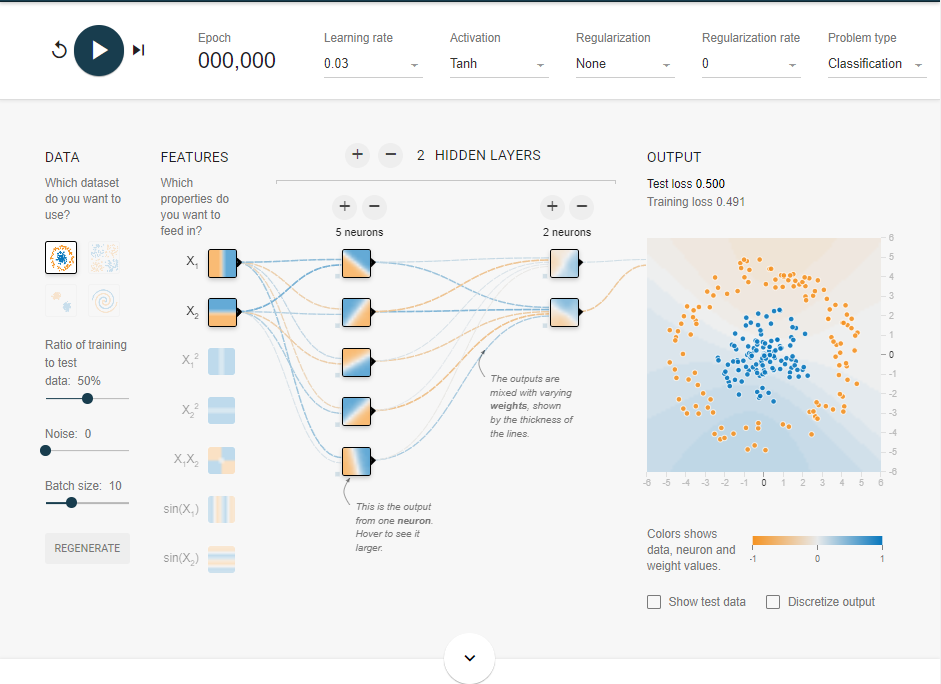

RNA después de entrenar:

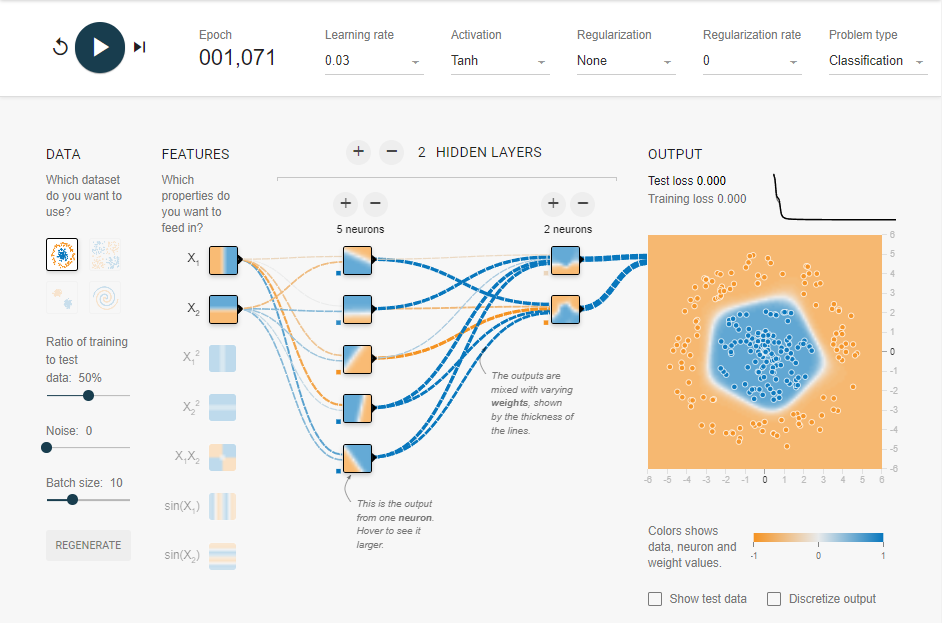

Como se puede observar, tras 1071 epochs la red neuronal ha conseguido 0 de test y de training loss, por tanto, la red neuronal ha sido capaz de clasificar los datos a la perfección.

<div style="background-color:#5DADE2"><b>Apartado 2</b></div>

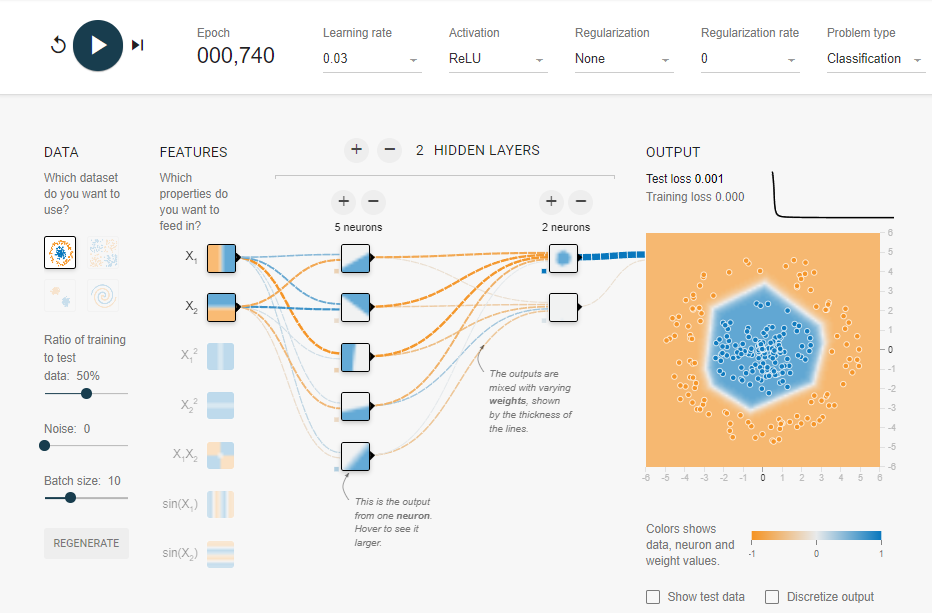

La RNA con la función de activación ha logrado llegar a un punto de clasificación prácticamente perfecta algo más rápido que el caso anterior, como dice el enunciado. Con este conjunto de datos, la función de activación ReLU es mejor, pero siempre hay que realizar comprobaciones

<div style="background-color:#5DADE2"><b>Apartado 3</b></div>

Tal y como se comenta en el enunciado de este apartado, las redes neuronales tardan mucho más en conseguir un loss tanto de test como de train parecidos a los de los otros casos. De hecho, llega un momento que no consigue optimizarse más.

Un ejemplo es como el de la siguiente imagen, donde por más tiempo que se le de, no es capaz de mejorar el test loss de 0.11:

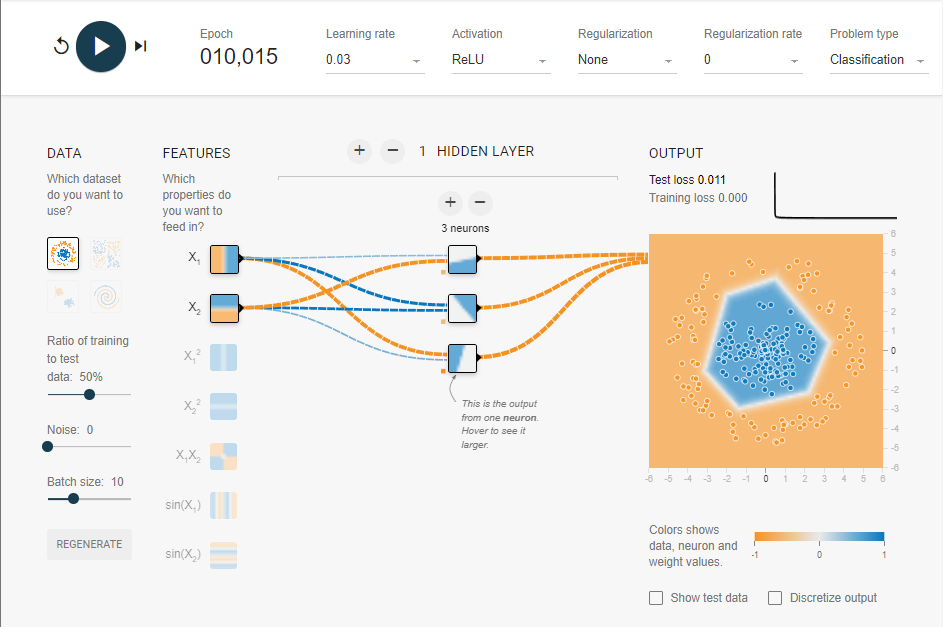

<div style="background-color:#5DADE2"><b>Apartado 4</b></div>

Para realizar este ejercicio se ha reducido una neurona en la capa oculta, y tal como se esperaba, el modelo tiene un mal rendimiento, ya que no es capaz de clasificar correctamente los datos, además de que no es capaz de mejorar con el paso de los epochs.

Para realizar esta prueba, se ha entrenado la red neuronal artificial con las mismas características 3 veces. En las tres ocasiones ha pasado lo mismo, un modelo incapaz de clasificar correctamente, y que llega a un punto de no mejora. Un ejemplo es el siguiente:

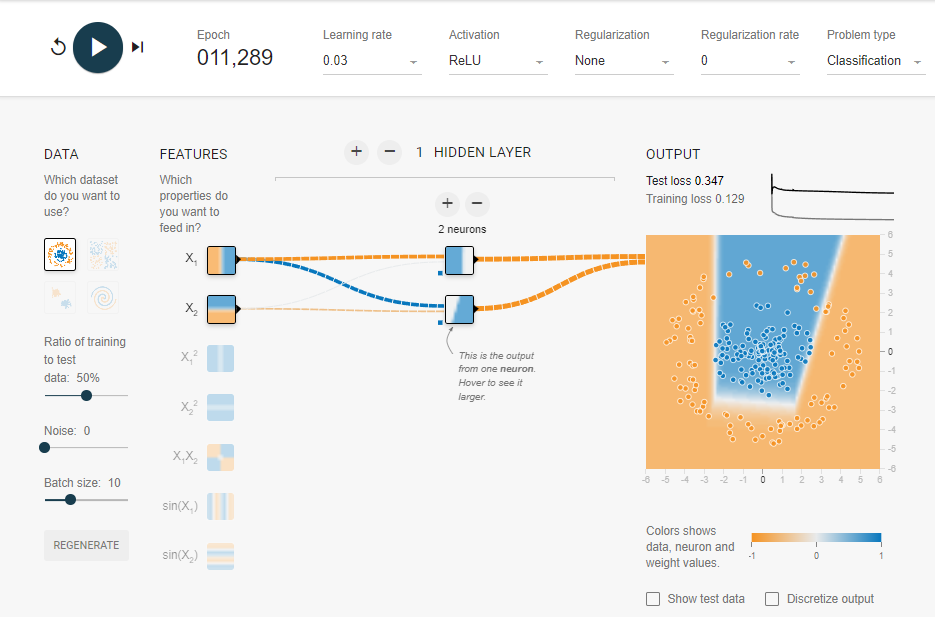

<div style="background-color:#5DADE2"><b>Apartado 5</b></div>

Tal y como se esperaba, ahora el modelo es capaz de clasificar perfectamente los datos, aparte de conseguir optimizarse hasta obtener resultados prácticamente perfectos. Esto demuestra que tener un mayor número de neuronas ayuda a obtener mejores rendimientos:

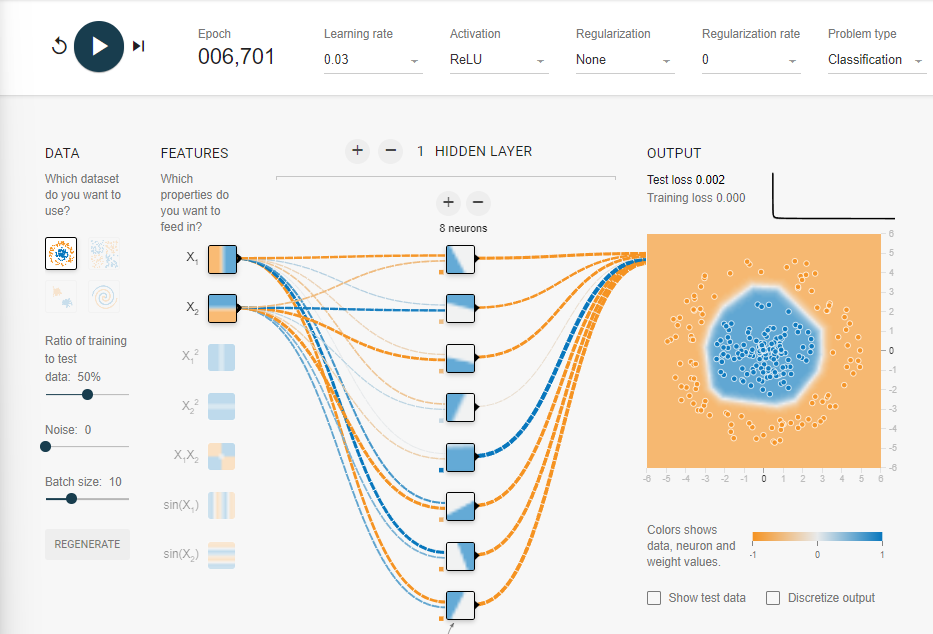

<div style="background-color:#5DADE2"><b>Apartado 6</b></div>

Este es el modelo que más ha tardado en tener unas pérdidas prácticamente a cero, lógico ya que tiene una gran cantidad de neuronas en comparación a las otras RNA, y necesita más tiempo de entrenamiento:

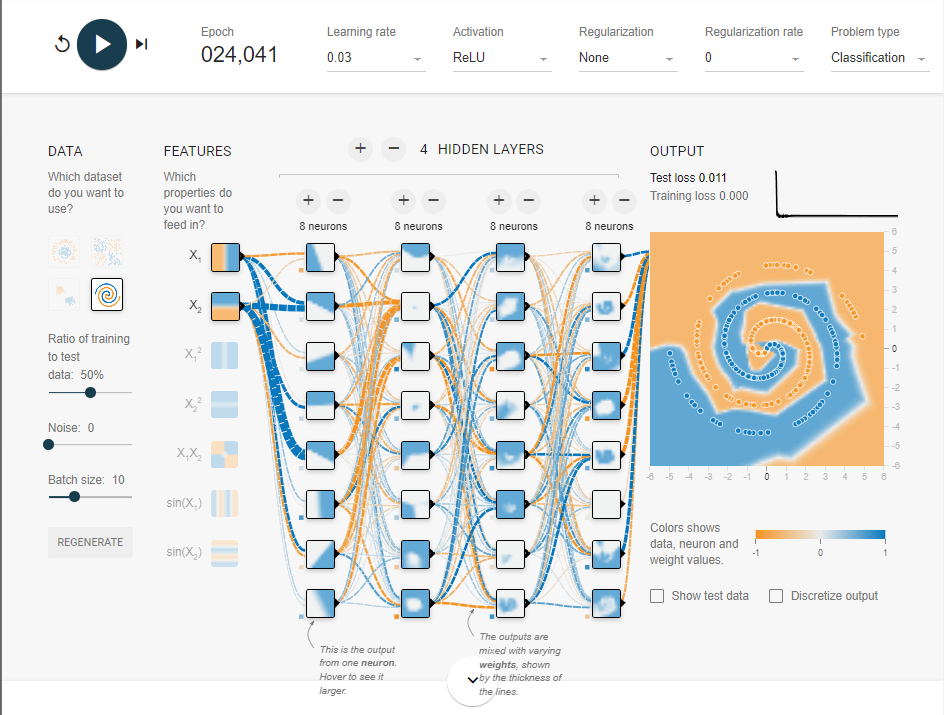

<div style="background-color:#5DADE2"><b>Apartado 7</b></div>

Para este ejercicio, se va a elegir el segundo conjunto de datos llamado "Exclusive or". Todas las RNA van a completar o 5000 epochs, o las epochs necesarias para obtener un punto de no pérdidas, o cuando lleguen a un punto donde no se puedan optimizar más.

Los resultados han sido los siguientes:

- 4 capas, 8-6-4-2 neuronas respectivamente, función de activación ReLU:

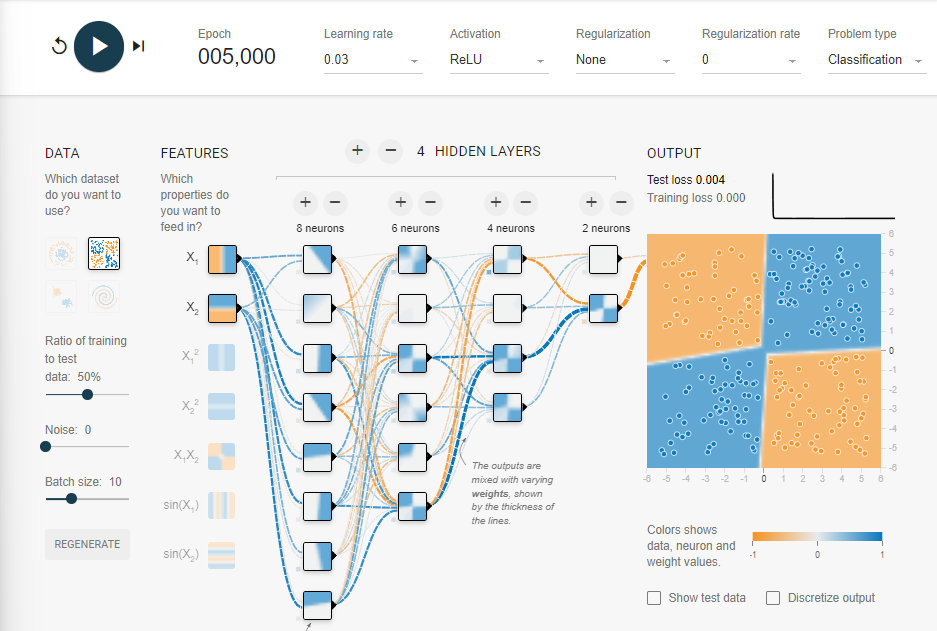

- 3 capas, 6-4-2 neuronas respectivamente, función de activación ReLU:

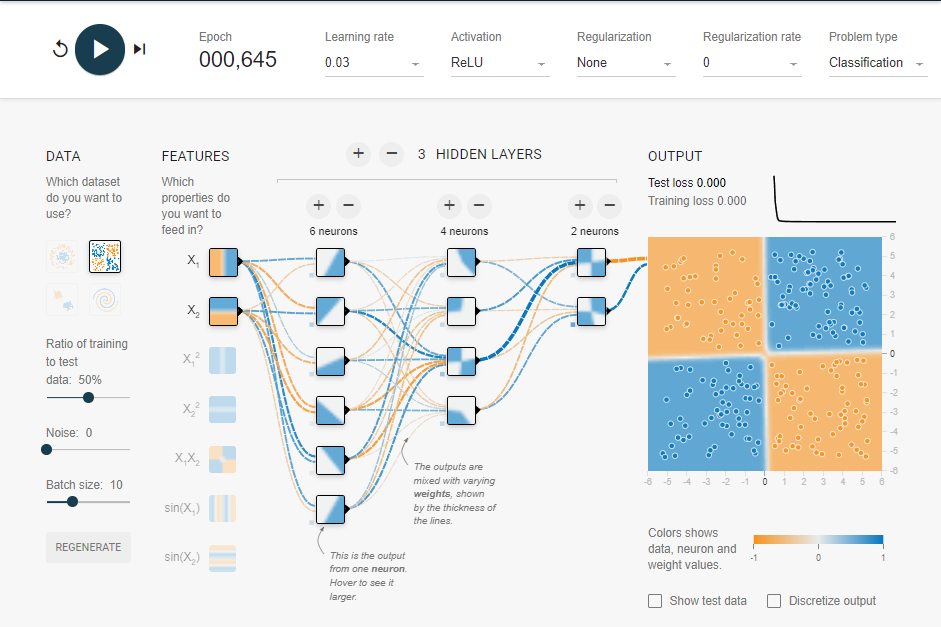

- 3 capas, 6-4-2 neuronas respectivamente, función de activación Tanh:

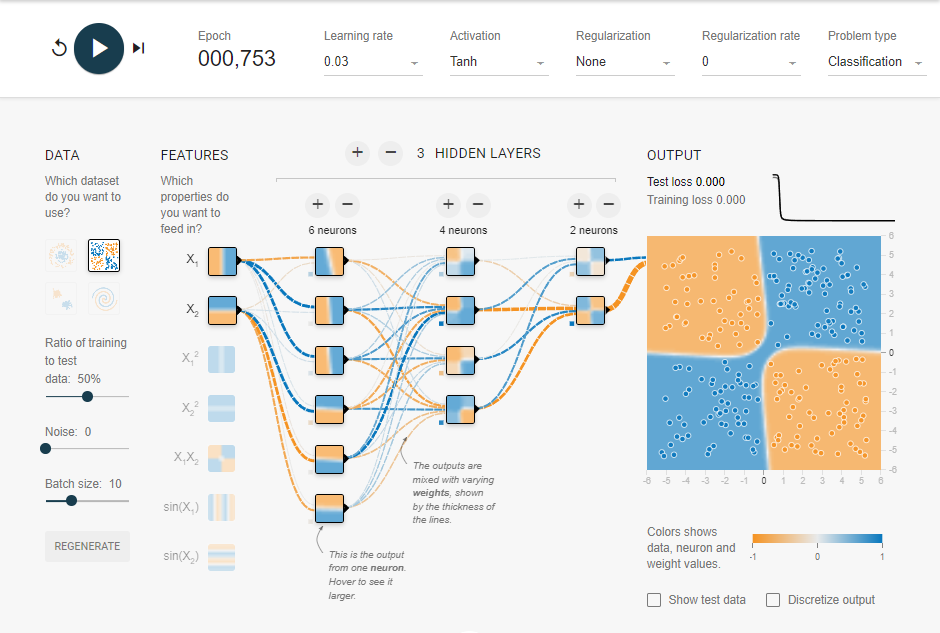

### 05 Ejercicio [2 puntos]

En este ejercicio se plantea un **problema de clasificación multiclase** de diferentes artículos de ropa y calzado. Tendréis que crear vuestra propia red neuronal de convolución desde el principio tratando de conseguir la mayor precisión posible utilizando el conjunto de datos Fashion-MNIST. Explicar con detalle cada una de las fases del proceso de diseño, entrenamiento y validación de la arquitectura de red que propongáis.

El conjunto de datos de *Fashion-MNIST* viene precargado en la librería de Keras. Os dejo el enlace al repositorio de GitHub [https://github.com/zalandoresearch/fashion-mnist](https://github.com/zalandoresearch/fashion-mnist). El objetivo será partiendo de la estructura de una red neuronal de convolución base sencilla con una única capa de convolución y max-pooling, encontrar la estructura de una red neuronal de convolución que proporcione una precisión elevada del conjunto de prueba ($> 85\%$). Para ello, tendréis que aplicar las siguientes medidas para mejorar el proceso de diseño y entrenamiento de la red base hasta alcanzar dicho objetivo:

1. Realizar una explicación descriptiva del conjunto de datos que se os pide analizar.
2. Diseñar, entrenar y validar una red neuronal de convolución base sencilla con una única capa de convolución y max-pooling.
3. Modificar el número de capas de convolución, max-pooling, ocultas, dropout y realizar diferentes pruebas.
4. Aplicar la técnica de validación cruzada k-fold y realizar diferentes pruebas.
5. Utilizar otro conjunto de parámetros e hiperparámetros con la técnica de grid-search y realizar diferentes pruebas.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 05</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1</b></div>

El dataset Fashion-MNIST contiene imágenes de prendas de vestir y de calzado provenientes de la página web Zalando.

A continuación se cargará dicho dataset, y se comprobará el tamaño de este, y se definirán las clases(tipos de prenda) que se indican en la página web de donde provienen los datos, ya que originalmente vienen con un label numérico del 0 al 9:

In [ ]:
from keras.datasets import fashion_mnist
import matplotlib.pyplot as plt

# Cargar los datos en los conjuntos de train y test
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

# Crear los nombres de las clases
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# Comprobar el tamaño de los datos
print("Numero de elementos de train_labels:",len(train_labels))
print("Numero de elementos de test_labels):",len(test_labels))

4422102/4422102 [==============================] - 0s 0us/step
Numero de elementos de train_labels: 60000
Numero de elementos de test_labels): 10000


El siguiente paso es visualizar una pequeña porción del dataset, para conocer mejor con que datos se está trabajando:

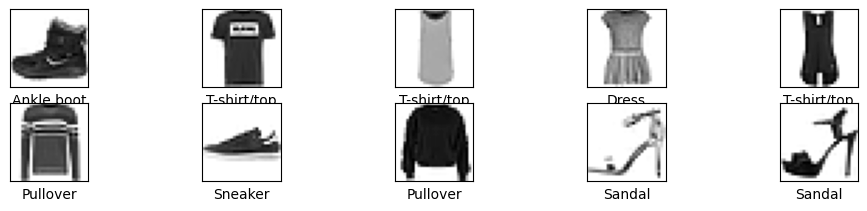

In [ ]:
# Visualización de las 10 primeras prendas
plt.figure(figsize=(12,12))
for i in range(10):
    plt.subplot(10,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

El siguiente paso es normalizar los datos, en este caso las imágenes. Originalmente, en este caso, las imágenes están en una escala de grises de 0 a 255, y se va a pasar a una escala de 0 a 1. Esto permitirá optimizar la futura RNA.

In [ ]:
# Escalado a rango 0-1
train_images = train_images.astype('float32')
test_images = test_images.astype('float32')

train_images = train_images / 255.0
test_images = test_images / 255.0

<div style="background-color:#5DADE2"><b>Apartado 2</b></div>

Para crear la RNC con una sola capa de convolución, y otra de max pooling, habrá que realizar lo siguiente:

- Importar todos los paquetes necesarios

- Inicializar el objeto que contendrá la RNC

- Añadir una capa de entrada de convolución compatible con los datos que se van a introducir, en este caso, las imágenes cargadas anteriormente

- Añadir la capa de max-pooling, y a continuación la de aplanado

- Terminar la estructura con la capa final con la función de activación softmax

- Compilar la RNC

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout

In [ ]:
# Crear la estructura de la red neuronal
model = Sequential()

# Capa de entrada
model.add(Conv2D(28, (3, 3), activation='relu', input_shape=(28, 28, 1)))

# Capa de max-pooling
model.add(MaxPool2D((2, 2)))

# Capa de aplanado
model.add(Flatten())

# Capa de salida
model.add(Dense(10, activation='softmax'))

# Compilar el modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Entrenar el modelo
model.fit(train_images, train_labels, validation_data=(test_images, test_labels), epochs=50)

Epoch 1/50
1875/1875 [==============================] - 9s 3ms/step - loss: 0.4454 - accuracy: 0.8438 - val_loss: 0.3499 - val_accuracy: 0.8798
Epoch 2/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3126 - accuracy: 0.8897 - val_loss: 0.3156 - val_accuracy: 0.8870
Epoch 3/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2781 - accuracy: 0.9030 - val_loss: 0.3119 - val_accuracy: 0.8890
Epoch 4/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2564 - accuracy: 0.9093 - val_loss: 0.3083 - val_accuracy: 0.8883
Epoch 5/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2385 - accuracy: 0.9151 - val_loss: 0.2859 - val_accuracy: 0.8968
Epoch 6/50
1875/1875 [==============================] - 5s 3ms/step - loss: 0.2243 - accuracy: 0.9200 - val_loss: 0.2737 - val_accuracy: 0.9004
Epoch 7/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2108 - accuracy: 0.9248 - val_loss: 0.2766 - val_accuracy:

El resultado ha sido muy bueno teniendo en cuenta que es una RNC con una estructura básica. Se ha obtenido como mínimo un accuracy de 84% en entrenamiento y 87% en validación, que ya es un dato muy bueno, y un máximo de 97% en entrenamiento y un 90% en validación, que es un resultado muy prometedor, ya que tal vez se pueda mejorar añadiendo más elementos a la estructura de la RNC, aunque el resultado actual ya es muy bueno.

<div style="background-color:#5DADE2"><b>Apartado 3</b></div>

La estructura de la red neuronal modificada para intentar mejorar el resultado de la anterior va a ser la siguiente:

1 - Capa de entrada de imágenes de 28x28 de una sola capa, y capa de convolución de 28 filtros de tamaño 3x3 con función de activación ReLU

2 - Capa de MaxPool con una ventana de 2x2

3 - Capa de convolución de 64 filtros de tamaño 3x3, con función de activación ReLU

4 - Capa de MaxPool con un tamaño de ventana 2x2

5 - Capa de aplanado, flatten

6 - Capa oculta de 64 nodos con función de activación ReLU

7 - Capa densa de salida, con 10 posibilidades posibles, y función de activación softmax

Para compilar la red se han utilizado los mismos parámetros que la red original, optimizador adam, función de pérdidas sparse_categorical_crossentropy y accuracy como métrica.

Las diferencias con la red original son:

- Añadido de capa convolucional, y capa de max pooling antes de la capa de aplanado.

- Añadido de una capa oculta entre la capa de flatten y la capa de salida.

Estas mejoras permiten obtener más características de las imágenes, y permite que la red convolucional pueda procesar y aprender con mayor profundidad, lo que puede llevar a mejores resultados.

A continuación se contruirá la red propuesta:

In [ ]:
model_2 = Sequential()

# Capa de entrada
model_2.add(Conv2D(28, (3, 3), activation='relu', input_shape=(28, 28, 1)))

# Capa de max-pooling
model_2.add(MaxPool2D((2, 2)))

# Segunda capa de convolucion
model_2.add(Conv2D(64, (3, 3), activation='relu'))

# Segunda capa de max-pooling
model_2.add(MaxPool2D((2, 2)))

# Capa de aplanado
model_2.add(Flatten())

# Capa oculta
model_2.add(Dense(64, activation='relu'))

# Capa de salida
model_2.add(Dense(10, activation='softmax'))

# Compilar el modelo
model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_model2 = model_2.fit(train_images, train_labels, validation_data=(test_images, test_labels), epochs=50)

Epoch 1/50
1875/1875 [==============================] - 11s 5ms/step - loss: 0.4767 - accuracy: 0.8269 - val_loss: 0.3830 - val_accuracy: 0.8560
Epoch 2/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3150 - accuracy: 0.8850 - val_loss: 0.3120 - val_accuracy: 0.8884
Epoch 3/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2686 - accuracy: 0.9021 - val_loss: 0.2974 - val_accuracy: 0.8901
Epoch 4/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2352 - accuracy: 0.9143 - val_loss: 0.2745 - val_accuracy: 0.9025
Epoch 5/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2132 - accuracy: 0.9209 - val_loss: 0.2628 - val_accuracy: 0.9051
Epoch 6/50
1875/1875 [==============================] - 9s 5ms/step - loss: 0.1916 - accuracy: 0.9282 - val_loss: 0.2524 - val_accuracy: 0.9090
Epoch 7/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.1748 - accuracy: 0.9350 - val_loss: 0.2659 - val_accuracy

Tras el entrenamiento, se va a realizar un análisis del rendimiento de la nueva red convolucional.

Para ello, se va a calcular el accuracy con el conjunto de test, y se van a visualizar las gráficas de accuracy y de loss que se ha ido obteniendo en el proceso de entrenamiento, tanto del conjunto de train como de test:

313/313 [==============================] - 1s 4ms/step - loss: 0.8453 - accuracy: 0.9023
Test accuracy: 0.9023000001907349


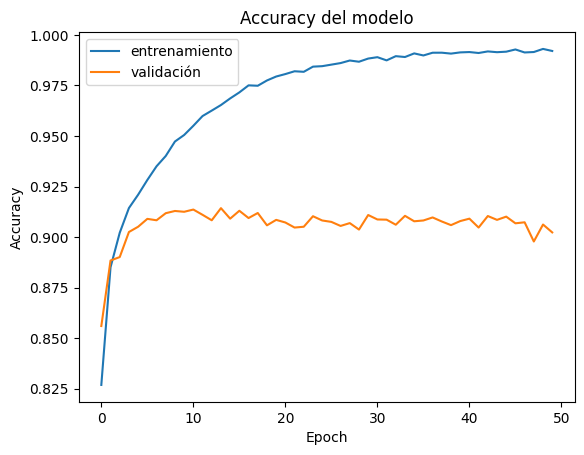

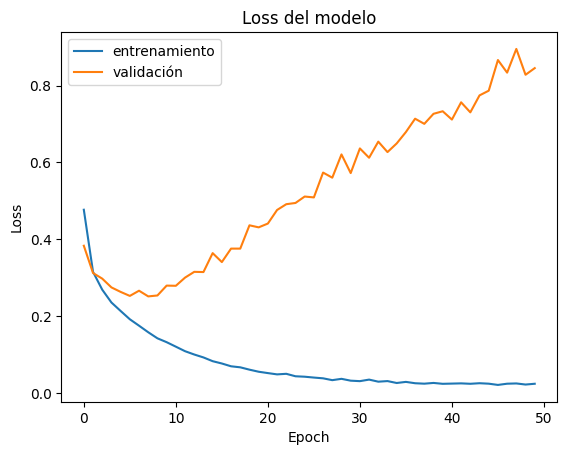

In [ ]:
# Calculo del accuracy del conjunto de test
test_loss, test_acc = model_2.evaluate(test_images,  test_labels)
print('Test accuracy:', test_acc)

# Gráfica del accuracy del conjunto de train y test
plt.plot(history_model2.history['accuracy'])
plt.plot(history_model2.history['val_accuracy'])
plt.title("Accuracy del modelo")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

# Gráfica de las pérdidas del conjunto de train y test
plt.plot(history_model2.history['loss'])
plt.plot(history_model2.history['val_loss'])
plt.title("Loss del modelo")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

Esta red neuronal esta claramente sobreajustada. A pesar de que el accuracy sea muy bueno en ambos casos, las pérdidas son las que nos muestran los problemas que tiene esta red neuronal convolucional. Con el paso de las épocas, el conjunto de test tiene unas pérdidas muy altas, superando el 80%.

Esto, como se ha dicho antes, es un caso clarísimo de sobreajuste, que se debe solucionar, por ejemplo, añadiendo capas de droput a la estructura de la red neuronal convolucional.

La siguiente prueba se centrará en intentar obtener los mismos resultados, pero reduciendo lo máximo posible las pérdidas en el conjunto de validación.

In [ ]:
from keras.layers import Dropout

# Ejemplo de una red neuronal modificada 3
# Crear la estructura de la red neuronal
model_3 = Sequential()

# Capa de entrada
model_3.add(Conv2D(28, (3, 3), activation='relu', input_shape=(28, 28, 1)))

# Capa de max-pooling
model_3.add(MaxPool2D((2, 2)))

# Segunda capa de convolucion
model_3.add(Conv2D(64, (3, 3), activation='relu'))

# Capa de dropout
model_3.add(Dropout(0.5))

# Segunda capa de max-pooling
model_3.add(MaxPool2D((2, 2)))

# Capa de aplanado
model_3.add(Flatten())

# Capa oculta
model_3.add(Dense(64, activation='relu'))

# Capa de dropout
model_3.add(Dropout(0.5))

# Segunda capa oculta
model_3.add(Dense(64, activation='relu'))

# Capa de salida
model_3.add(Dense(10, activation='softmax'))

# Compilar el modelo
model_3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_model3 =model_3.fit(train_images, train_labels, validation_data=(test_images, test_labels), epochs=50)

Epoch 1/50
1875/1875 [==============================] - 13s 5ms/step - loss: 0.7111 - accuracy: 0.7324 - val_loss: 0.5375 - val_accuracy: 0.8195
Epoch 2/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.5066 - accuracy: 0.8127 - val_loss: 0.4634 - val_accuracy: 0.8268
Epoch 3/50
1875/1875 [==============================] - 9s 5ms/step - loss: 0.4440 - accuracy: 0.8363 - val_loss: 0.4789 - val_accuracy: 0.8189
Epoch 4/50
1875/1875 [==============================] - 9s 5ms/step - loss: 0.4030 - accuracy: 0.8520 - val_loss: 0.3853 - val_accuracy: 0.8715
Epoch 5/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3805 - accuracy: 0.8600 - val_loss: 0.3844 - val_accuracy: 0.8592
Epoch 6/50
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3633 - accuracy: 0.8673 - val_loss: 0.4181 - val_accuracy: 0.8392
Epoch 7/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3461 - accuracy: 0.8741 - val_loss: 0.4175 - val_accuracy

313/313 [==============================] - 1s 4ms/step - loss: 0.3622 - accuracy: 0.8631
Test accuracy: 0.863099992275238


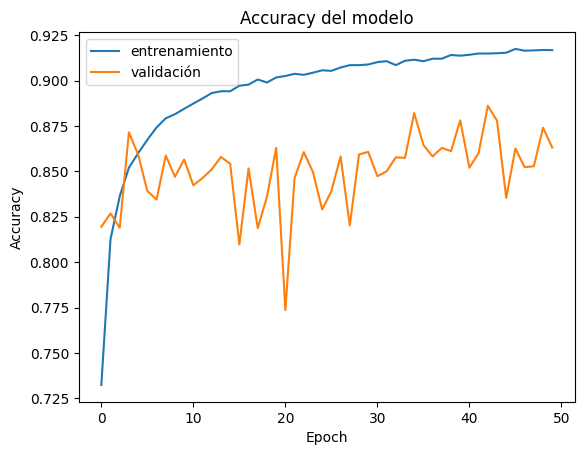

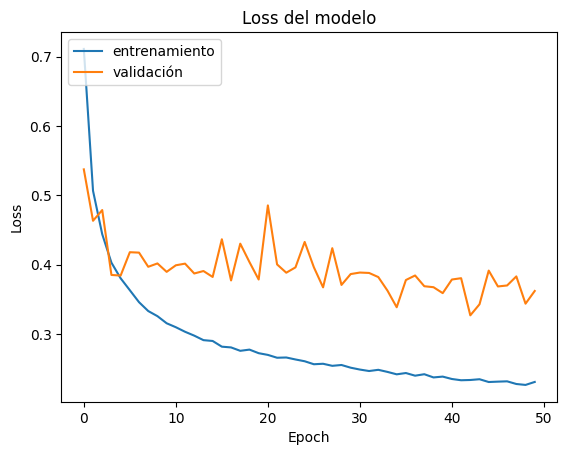

In [ ]:
# Calculo del accuracy del conjunto de test
test_loss, test_acc = model_3.evaluate(test_images,  test_labels)
print('Test accuracy:', test_acc)

# Gráfica del accuracy del conjunto de train y test
plt.plot(history_model3.history['accuracy'])
plt.plot(history_model3.history['val_accuracy'])
plt.title("Accuracy del modelo")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

# Gráfica de las pérdidas del conjunto de train y test
plt.plot(history_model3.history['loss'])
plt.plot(history_model3.history['val_loss'])
plt.title("Loss del modelo")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

El añadido de capas de dropout ha permitido reducir drásticamente la pérdida del modelo en el conjunto de validación, lo que es un gran avance, ya que se ha reducido mas del 50% de manera consistente a partir de las 30 épocas.

Sigue siendo unas pérdidas algo altas, pero asumibles, ya que la precisión del modelo en el conjunto de entrenamiento y validación es bastante alta, entre el 86% - 90%

<div style="background-color:#5DADE2"><b>Apartado 4</b></div>

El KFold, o validación cruzada, sirve para evaluar modelos de forma precisa, separando el dataset en particiones (folds).

Para ello, el primer paso es importar scikeras, para poder utilizar el método KerasClassifier, que permite utilizar funcionalidades de scikitlearn con modelos de Keras.

Después se importará StratifiedKFold y cross_val_score que permitirá realizar el KFold y después comprobar como ha ido.

Ahora hay que construir una RNC, dentro de la función create_model. Va a ser con la siguiente estructura:

- Capa de entrada y capa de convolucion (función de activación relu)
- Capa de Maxpool
- Segunda capa de convolucion (función de activación relu)
- Segunda capa de Maxpool
- Capa de Flatten
- Primera capa densa (función de activación relu)
- Segunda capa densa (función de activación softmax)
- Capa de salida (optimizador adam, metrica de precisión)

Posterior a esto se creará un objeto KerasClassifier, para poder utilizar el modelo anteriormente creado con funciones de scikitlearn.

Después ya se puede crear el objeto que realizará el KFold, con el método StratifiedKFold. Se marcará que se realizarán 7 splits, y con shuffle.

Para poder visualizar resultados, se usa el último método importado, cross_val_score, al cual se le pasan los datasets de entrenamiento, y el objeto que contiene el kfold anteriormente creado.

Por último se visualizan los resultados:


In [ ]:
pip install scikeras

In [ ]:
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Crear la estructura de la red neuronal
def create_model():
    model = Sequential()
    model.add(Conv2D(28, (3, 3), activation='relu', input_shape=(28, 28, 1)))
    model.add(MaxPool2D((2, 2)))
    model.add(Conv2D(64, (3,3), activation = 'relu'))
    model.add(MaxPool2D((2, 2)))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Crear un clasificador Keras
keras_estim = KerasClassifier(model=create_model, epochs=10)

# Crear un objeto StratifiedKFold
kfold = StratifiedKFold(n_splits=7, shuffle=True)

# Evaluar el modelo usando StratifiedKFold
cv_results = cross_val_score(keras_estim, train_images, train_labels, cv=kfold, n_jobs=-1)

# Imprimir el puntaje promedio de validación cruzada
print('Puntaje promedio de validación cruzada:', cv_results.mean())

print("Baseline: %.2f%% (%.2f%%)" % (cv_results.mean()*100, cv_results.std()*100))

Epoch 1/10
1608/1608 [==============================] - 10s 5ms/step - loss: 0.6784 - accuracy: 0.7520
Epoch 2/10
1608/1608 [==============================] - 13s 8ms/step - loss: 0.4879 - accuracy: 0.8233
Epoch 3/10
1608/1608 [==============================] - 13s 8ms/step - loss: 0.4356 - accuracy: 0.8448
Epoch 4/10
1608/1608 [==============================] - 12s 8ms/step - loss: 0.4010 - accuracy: 0.8533
Epoch 5/10
1608/1608 [==============================] - 10s 6ms/step - loss: 0.3746 - accuracy: 0.8648
Epoch 6/10
1608/1608 [==============================] - 8s 5ms/step - loss: 0.3646 - accuracy: 0.8680
Epoch 7/10
1608/1608 [==============================] - 7s 4ms/step - loss: 0.3485 - accuracy: 0.8733
Epoch 8/10
1608/1608 [==============================] - 8s 5ms/step - loss: 0.3422 - accuracy: 0.8754
Epoch 9/10
1608/1608 [==============================] - 7s 4ms/step - loss: 0.3356 - accuracy: 0.8773
Epoch 10/10
268/268 [==============================] - 1s 2ms/step
Epoch 1/10

In [ ]:
variance = cv_results.std()
print(variance)

0.9031667363427279
0.0034841829534497442


El puntaje promedio de la validación cruzada es 0.903, lo que significa que la red neuronal convolucional creada es capaz de acertar el 90.03% de veces, lo que indica un muy buen rendimiento.

Aparte, la varianza es de 0.003, lo que indica que el modelo es consistente con sus predicciones, además de indicar que no hay un sobreajuste muy notable.

Para intentar mejorar este resultado, se va a aumentar el número de epochs de la red neuronal a 20, y el número de splits a 15, para comprobar si más es mejor, o si no es necesario y no es el camino para llegar a mejorar el rendimiento del modelo:

In [ ]:
keras_estim2 = KerasClassifier(model=create_model, epochs=20)

kfold2 = StratifiedKFold(n_splits=15, shuffle=True)

cv_results2 = cross_val_score(keras_estim2, train_images, train_labels, cv=kfold2, n_jobs=-1)

print('Puntaje promedio de validación cruzada:', cv_results2.mean())
variance = cv_results2.std()
print('Varianza:',variance)

Puntaje promedio de validación cruzada: 0.9116499999999998
Varianza: 0.004012272838844993


<div style="background-color:#5DADE2"><b>Apartado 5</b></div>

GridSearch se ocupa de probar todos los hiperparámetros que se le marque y guardar el conjunto que mejor resultados obtenga.

Para poder usarlo hay que importarlo de sklearn y crear un diccionario con todos los parámetros que se quieren probar, en este caso el tamaño de lote (10 o 20), el número de epochs (10 o 20) y el tipo de optimizador (adam o sdg). Se podría aumentar el número de variables, pero hay que tener en cuenta que el GridSearchCV prueba todas y cada una de las combinaciones posibles buscando la mejor posible. Teniendo en cuenta que entrenar una red de convolución es tardado, entrenar 12 modelos como en este caso es suficiente para probar la funcionalidad.

Se va a volver a utilizar el mismo modelo, con el fin de poder comprobar el efecto del GridSearch en comparación al KFold:

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:

def create_model():
    model = Sequential()
    model.add(Conv2D(28, (3, 3), activation='relu', input_shape=(28, 28, 1)))
    model.add(MaxPool2D((2, 2)))
    model.add(Conv2D(64, (3,3), activation = 'relu'))
    model.add(MaxPool2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

model = KerasClassifier(model=create_model, epochs=10, batch_size=32)

param_grid = {'batch_size': [32, 64],
              'epochs': [10, 20],
              'optimizer':['adam','sgd']}

grid = GridSearchCV(estimator=model, param_grid=param_grid)
grid_result = grid.fit(train_images,train_labels)

print("Resultado y mejores parámetros: %f usando %s" % (grid_result.best_score_, grid_result.best_params_))

Epoch 1/10
1500/1500 [==============================] - 11s 3ms/step - loss: 0.7002 - accuracy: 0.7436
Epoch 2/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.4923 - accuracy: 0.8195
Epoch 3/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.4290 - accuracy: 0.8438
Epoch 4/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.3906 - accuracy: 0.8588
Epoch 5/10
1500/1500 [==============================] - 5s 4ms/step - loss: 0.3596 - accuracy: 0.8676
Epoch 6/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.3432 - accuracy: 0.8731
Epoch 7/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.3233 - accuracy: 0.8826
Epoch 8/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.3055 - accuracy: 0.8876
Epoch 9/10
1500/1500 [==============================] - 5s 3ms/step - loss: 0.2930 - accuracy: 0.8906
Epoch 10/10
375/375 [==============================] - 1s 2ms/step
Epoch 1/10
150

Los parámetros óptimos encontrados por el método GridSearchCV son:

- batch_size: 64
- epochs: 20
- optimizer: sgd

El accuracy del mejor modelo ha sido de 91.39%, con un loss alrededor del 0.2, por lo que los resultados son bastante bueno, y se ha mejorado las redes de los ejercicios anteriores.

Por tanto, este método es imprescindible a la hora de intentar crear una red, ya sea convolucional o neuronal, ya que permite de manera cómoda encontrar los mejores parámetros posibles para cada caso.

# Bloque 3: Ejercicio avanzado de la prueba <a id="topic4"></a>&nbsp;&nbsp;<a href="#index"><i class="fa fa-list-alt" aria-hidden="true"></i></a>

### 06 Ejercicio [2 puntos]

En este ejercicio se plantea un **problema de ajuste de una red neuronal sobre un conjunto de datos precargado en Keras o TensorFlow**. En concreto, tendréis que tomar una base de datos publicada por el equipo de Keras o TensorFlow. También os podéis descargar una base de datos de Kaggle o cualquier otro repositorio que os interese. Algunas de las más empleadas son las siguientes (podéis elegir cualquier otra). En el siguiente enlace podéis consultar las características de dichos dataset: [https://www.tensorflow.org/datasets/catalog/overview](https://www.tensorflow.org/datasets/catalog/overview).


- **CIFAR-10**: conjunto de datos de $50.000$ imágenes de entrenamiento en color de $32 × 32$, etiquetadas en $10$ categorías y $10.000$ imágenes de prueba.


- **CIFAR-100**: conjunto de datos de $50.000$ imágenes de entrenamiento en color de $32 × 32$, etiquetadas en $100$ categorías y $10.000$ imágenes de prueba.


- **IMDB**: conjunto de datos formado por $25.000$ reseñas de películas de IMDB, etiquetadas por valoraciones (positivas/negativas). Las revisiones han sido preprocesadas y cada una de ellas se codifica como una secuencia de índices de palabras (enteros).


- **Reuters newswire topics classification**: conjunto de datos de $11.228$ noticias de Reuters, sobre más de $46$ temas.

El objetivo será proponer la estructura de una red neuronal (multicapa o de convolución) que proporcione una precisión elevada del conjunto de prueba (> $89\%$) basándose en la información recogida en el dataset que cada uno elija. Realizar los siguientes apartados:

1. Explicar con detalle el problema que queréis modelizar así como el procedimiento de Extracción, Transformación y Carga (ETL) de la base de datos utilizada a medida que la vais analizando.
2. Describir a la vez que vais implementado vuestro modelo cada una de las fases que intervienen en el diseño, entrenamiento y validación de la arquitectura de la red que propongáis como modelo base.
3. Utilizar en el proceso de mejora de entrenamiento y validación de la red las técnicas de dropout, validación cruzada k-fold y optimización de parámetros a través de la técnica de grid search obteniendo el conjunto de los mismos que proporcione una mayor precisión.
4. Utilizar en el proceso de mejora de entrenamiento y validación de la red las técnicas de tasas de aprendizaje, callbacks y monitorizar visualmente dicho proceso de entrenamiento.

<div style="background-color:#F7DC6F"><b>Resolución Ejercicio 06</b></div>

<div style="background-color:#5DADE2"><b>Apartado 1 - Explicar con detalle el problema que queréis modelizar así como el procedimiento de Extracción, Transformación y Carga (ETL) de la base de datos utilizada a medida que la vais analizando.</b></div>

Para este ejercicio se va a utilizar el dataset CIFAR 10 proveniente del repositorio oficial de datasets de Tensorflow. Este dataset 60000 imágenes de 10 clases distintas.

Las clases, ordenadas en valores de 0 a 9 dentro del dataset, son las siguientes:

- 0 - Airplane
- 1 - Automobile
- 2 - Bird
- 3 - Cat
- 4 - Deer
- 5 - Dog
- 6 - Frog
- 7 - Horse
- 8 - Ship
- 9 - Truck

El objetivo del ejercicio será clear una red neuronal convolucional capaz de clasificar las imágenes por sus clases.

El primer paso es importar este dataset. Para ello, se ha utilizado la función propia incluida por tensorflow:


In [ ]:
import numpy as np
from tensorflow.keras.datasets import cifar10

# Carga del dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
labels = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

170498071/170498071 [==============================] - 6s 0us/step


Como se puede observar, una de las facilidades de usar datasets ya preprocesados es que se importan directamente en los conjuntos de train y test con sus respectivas etiquetas.

A continuación se va a comprobar que tamaño tienen estos splits, para corroborar que la importación ha sido correcta:

In [ ]:
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(50000, 32, 32, 3) (50000, 1) (10000, 32, 32, 3) (10000, 1)


Efectivamente, se ha importado correctamente, ya que en el conjunto de entrenamiento hay 50000 imágenes, con sus 50000 etiquetas, y hay las 10000 restantes en el conjunto de validación, sumando un total de las 60000 que se sabían que formaban el dataset.
De esta línea de código también se puede extraer que se trata de imágenes RGB, con una resolución de 32x32 píxeles.

A continuación, se visualizarán algunas de las imágenes con sus respectivas etiquetas, para descubrir a fondo que hay en el dataset:

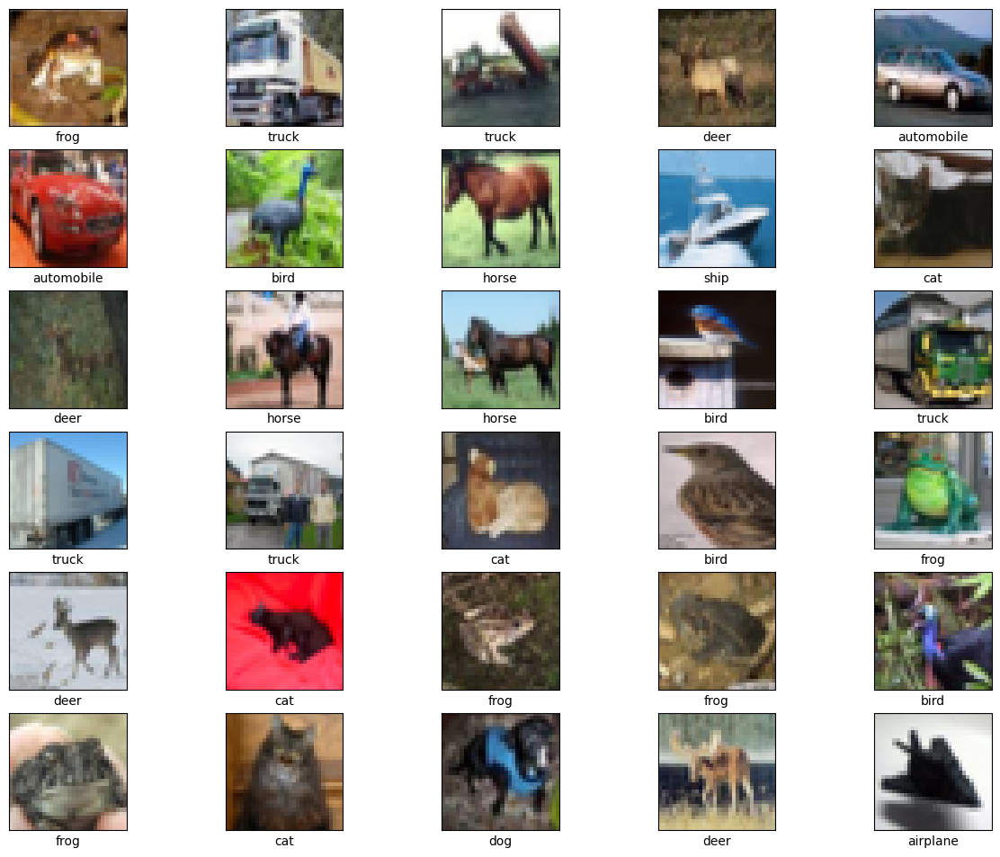

In [ ]:
import matplotlib.pyplot as plt # Importar plt para la visualización de imágenes
plt.figure(figsize=(15,20)) # Definir el tamaño del lienzo sobre el que irán las figuras
for i in range(30): # Bucle para mostrar 30 imágenes
    plt.subplot(10,5,i+1) # Colocado de cada imagen en su respectivo sitio
    plt.xticks([]) # Se elimina el visualizado de datos del eje x
    plt.yticks([]) # Se elimina el visualizado de datos del eje y
    plt.imshow(x_train[i], cmap=plt.cm.binary) # Se muestra cada imagen
    plt.xlabel(labels[y_train[i][0]]) # Se muestra la etiqueta de cada imagen
plt.show()

En estas imágenes encontramos lo esperado dentro del dataset, por lo que ahora estamos preparados para comenzar a construir una red neuronal convolucional capaz de clasificar estas imágenes en su respectiva clase.

<div style="background-color:#5DADE2"><b>Apartado 2 - Describir a la vez que vais implementado vuestro modelo cada una de las fases que intervienen en el diseño, entrenamiento y validación de la arquitectura de la red que propongáis como modelo base.</b></div>

El primer paso es escalar los datos, para que estos sean más eficientes para el entrenamiento de las redes neuronales. Para ello, se va a dividir entre 255 el conjunto de x_train y x_test, haciendo que todos los valores ronden alrededor de 0 y 1.

In [ ]:
x_train = x_train / 255
x_test = x_test / 255

from tensorflow.keras.utils import to_categorical
y_train_c = to_categorical(y_train, 10)
y_test_c = to_categorical(y_test, 10)

Ahora ya se puede proceder a construir una primera red convolucional simple, para observar que resultados obtiene e iterar a partir de ahí.

El primer paso es importar todos los paquetes necesarios:

In [ ]:
from tensorflow.keras.models import Sequential # Objeto inicializador de la red
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, BatchNormalization # Capas que se van a usar en las redes

La primera red convolucional será muy simple y sigue la siguiente estructura:

- Capa de entrada

- Capa de max pooling

- Capa de flatten

- Capa de salida con función de activación softmax

Para compilar la red se va a usar el optimizador adam, la función de pérdidas categorical_crossentropy, y accuracy como métrica.

In [ ]:
model_1 = Sequential()

# Capa de entrada y primera capa convolucional
model_1.add(Conv2D(filters=32, input_shape=(32, 32, 3), kernel_size=(3,3), activation='relu'))

# Capa de max-pooling
model_1.add(MaxPool2D((2, 2)))

# Capa de aplanado
model_1.add(Flatten())

# Capa de salida
model_1.add(Dense(10, activation='softmax'))

# Compilar el modelo
model_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_1.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 15, 15, 32)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 7200)              0         
                                                                 
 dense_7 (Dense)             (None, 10)                72010     
                                                                 
Total params: 72906 (284.79 KB)
Trainable params: 72906 (284.79 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model_1_fit = model_1.fit(x_train, y_train_c, validation_data=(x_test, y_test_c), epochs=50)

Epoch 1/50
1563/1563 [==============================] - 7s 4ms/step - loss: 1.4724 - accuracy: 0.4799 - val_loss: 1.2524 - val_accuracy: 0.5577
Epoch 2/50
1563/1563 [==============================] - 6s 4ms/step - loss: 1.2017 - accuracy: 0.5834 - val_loss: 1.2106 - val_accuracy: 0.5710
Epoch 3/50
1563/1563 [==============================] - 6s 4ms/step - loss: 1.1015 - accuracy: 0.6202 - val_loss: 1.1897 - val_accuracy: 0.5885
Epoch 4/50
1563/1563 [==============================] - 6s 4ms/step - loss: 1.0374 - accuracy: 0.6427 - val_loss: 1.0973 - val_accuracy: 0.6238
Epoch 5/50
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9908 - accuracy: 0.6606 - val_loss: 1.0793 - val_accuracy: 0.6304
Epoch 6/50
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9448 - accuracy: 0.6759 - val_loss: 1.0693 - val_accuracy: 0.6288
Epoch 7/50
1563/1563 [==============================] - 6s 4ms/step - loss: 0.9091 - accuracy: 0.6879 - val_loss: 1.0944 - val_accuracy:

Text(0.5, 1.0, 'Evolución de las pérdidas')

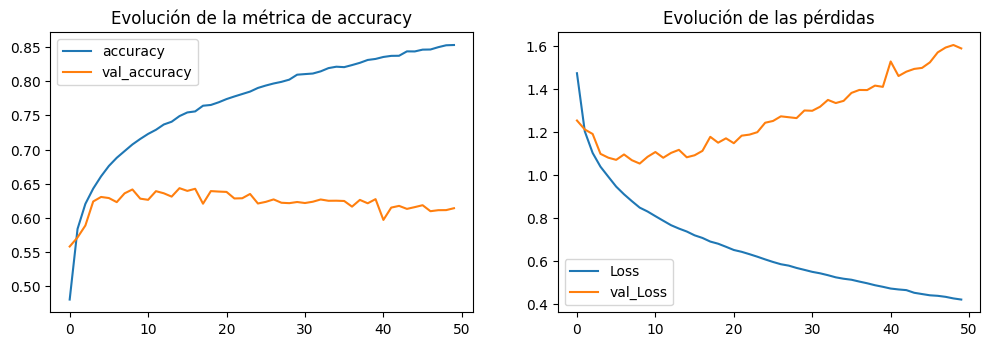

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_1_fit.history['accuracy'], label='accuracy')
plt.plot(model_1_fit.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.title('Evolución de la métrica de accuracy')

plt.subplot(2, 2, 2)
plt.plot(model_1_fit.history['loss'], label='Loss')
plt.plot(model_1_fit.history['val_loss'], label='val_Loss')
plt.legend()
plt.title('Evolución de las pérdidas')

In [ ]:
evaluation = model_1.evaluate(x_test, y_test_c)
print(f'Accuracy obtenido en el conjunto de test : {evaluation[1] * 100:.2f}%')

313/313 [==============================] - 1s 2ms/step - loss: 1.5878 - accuracy: 0.6139
Accuracy obtenido en el conjunto de test : 61.39%


<div style="background-color:#5DADE2"><b>Apartado 3 - Utilizar en el proceso de mejora de entrenamiento y validación de la red las técnicas de dropout, validación cruzada k-fold y optimización de parámetros a través de la técnica de grid search obteniendo el conjunto de los mismos que proporcione una mayor precisión.</b></div>

In [ ]:
model_2 = Sequential()

model_2.add(Conv2D(filters=32, input_shape=(32, 32, 3), kernel_size=(3,3), activation='relu'))
model_2.add(BatchNormalization())

model_2.add(Conv2D(64, (3, 3), activation='relu'))
model_2.add(BatchNormalization())

model_2.add(MaxPool2D((2, 2)))
model_2.add(Dropout(0.25))

model_2.add(Conv2D(64, (3, 3), activation='relu'))
model_2.add(BatchNormalization())
model_2.add(MaxPool2D(pool_size=(2, 2)))

model_2.add(Flatten())

model_2.add(Dense(256, activation='relu'))
model_2.add(Dropout(0.25))
model_2.add(Dense(10, activation='softmax'))

# Compilar el modelo
model_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 30, 30, 32)        896       
                                                                 
 batch_normalization_15 (Ba  (None, 30, 30, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_19 (Conv2D)          (None, 28, 28, 64)        18496     
                                                                 
 batch_normalization_16 (Ba  (None, 28, 28, 64)        256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 14, 14, 64)        0         
 ng2D)                                                           
                                                      

In [ ]:
model_2_fit = model_2.fit(x_train, y_train_c, validation_data=(x_test, y_test_c), epochs=100)

Epoch 1/100
1563/1563 [==============================] - 19s 8ms/step - loss: 1.3511 - accuracy: 0.5253 - val_loss: 1.0178 - val_accuracy: 0.6455
Epoch 2/100
1563/1563 [==============================] - 12s 7ms/step - loss: 0.9422 - accuracy: 0.6697 - val_loss: 0.9230 - val_accuracy: 0.6775
Epoch 3/100
1563/1563 [==============================] - 12s 7ms/step - loss: 0.8076 - accuracy: 0.7147 - val_loss: 0.8440 - val_accuracy: 0.7148
Epoch 4/100
1563/1563 [==============================] - 12s 8ms/step - loss: 0.7117 - accuracy: 0.7517 - val_loss: 1.0518 - val_accuracy: 0.6828
Epoch 5/100
1563/1563 [==============================] - 12s 8ms/step - loss: 0.6268 - accuracy: 0.7791 - val_loss: 0.8206 - val_accuracy: 0.7402
Epoch 6/100
1563/1563 [==============================] - 12s 8ms/step - loss: 0.5652 - accuracy: 0.8033 - val_loss: 0.9483 - val_accuracy: 0.7321
Epoch 7/100
1563/1563 [==============================] - 11s 7ms/step - loss: 0.4989 - accuracy: 0.8230 - val_loss: 0.9739 -

313/313 [==============================] - 1s 5ms/step - loss: 1.3247 - accuracy: 0.7876
Accuracy obtenido en el conjunto de test : 78.76%


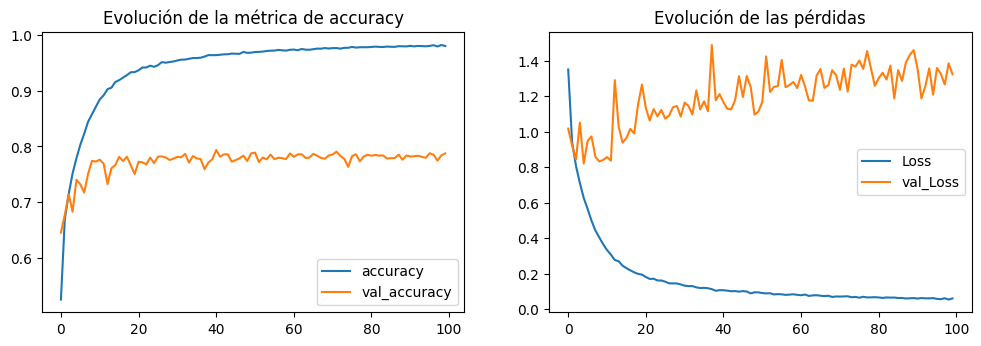

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_2_fit.history['accuracy'], label='accuracy')
plt.plot(model_2_fit.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.title('Evolución de la métrica de accuracy')

plt.subplot(2, 2, 2)
plt.plot(model_2_fit.history['loss'], label='Loss')
plt.plot(model_2_fit.history['val_loss'], label='val_Loss')
plt.legend()
plt.title('Evolución de las pérdidas')

evaluation = model_2.evaluate(x_test, y_test_c)
print(f'Accuracy obtenido en el conjunto de test : {evaluation[1] * 100:.2f}%')

In [ ]:
pip install scikeras

In [ ]:
# Crear la estructura de la red neuronal
def create_rnc():
  rnc = Sequential()
  rnc.add(Conv2D(filters=32, input_shape=(32, 32, 3), kernel_size=(3,3), activation='relu'))
  rnc.add(BatchNormalization())
  rnc.add(Conv2D(64, (3, 3), activation='relu'))
  rnc.add(BatchNormalization())
  rnc.add(MaxPool2D((2, 2)))
  rnc.add(Dropout(0.25))
  rnc.add(Conv2D(64, (3, 3), activation='relu'))
  rnc.add(BatchNormalization())
  rnc.add(MaxPool2D(pool_size=(2, 2)))
  rnc.add(Flatten())
  rnc.add(Dense(256, activation='relu'))
  rnc.add(Dropout(0.25))
  rnc.add(Dense(10, activation='softmax'))
  return rnc

rnc = KerasClassifier(model = create_rnc, loss = "categorical_crossentropy", metrics = ["accuracy"])

parameters = {
    'batch_size': [50, 70],
    'epochs': [100, 200],
    'optimizer': ['adam', 'sgd']
}

In [ ]:
# Definimos la técnica de grid.search sobre nuestra RNA utilizando el k-fold cv
grid_search = GridSearchCV(estimator=rnc,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           n_jobs = -1)

# Aplicamos la técnica de grid.search definida previamente sobre nuestro conjunto de entrenamiento
grid_search = grid_search.fit(x_train, y_train_c)

# Obtenemos los mejores valores de los hiperparámetros considerados y su precisión correspondiente
best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

In [ ]:
print(best_parameters)
print(best_accuracy)

Tras muchos intentos, Google Colab cierra mi sesión al estar entrenando el grid search. Adjunto captura de uno de los fallos:
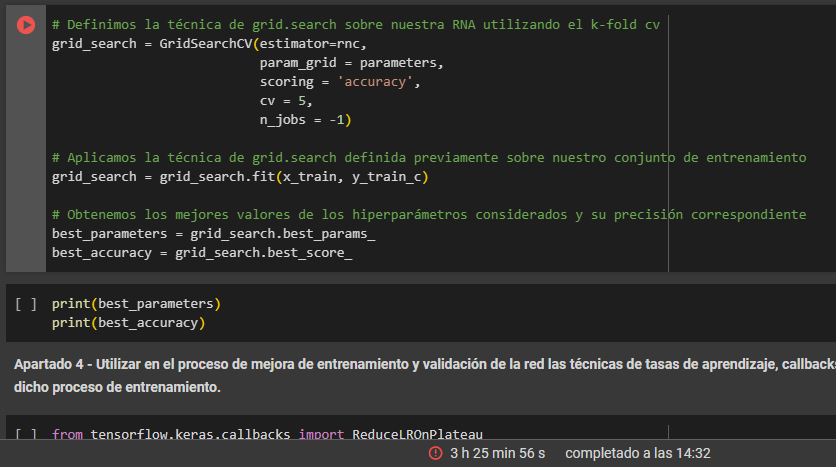

<div style="background-color:#5DADE2"><b>Apartado 4 - Utilizar en el proceso de mejora de entrenamiento y validación de la red las técnicas de tasas de aprendizaje, callbacks y monitorizar visualmente dicho proceso de entrenamiento.</b></div>

El último proceso de mejora de esta red neuronal será añadir callbacks a la fase de entrenamiento, además de modificar por última vez la estructura de la red.

Primero se van a añadir los callbacks. Los callbacks son funciones que se ejecutan en la fase de entrenamiento, realizando alguna acción sobre este proceso para intentar mejorarlo. Para ello, se importarán los módulos que contienen los callbacks que se van a utilizar en la última red neuronal:

- ReduceLROnPlateau: Reduce la tasa de aprendizaje cuando, según la métrica de monitorización elegida (en este caso accuracy) no mejora despúes de unos epochs marcados por el parámetro patiente.

- EarlyStopping: Detiene el entrenamiento cuando la métrica de monitorización no mejora durante un periodo de tiempo, definido por el parámetro patiente.

- Tensorboard: Permite monitorizar visualmente el proceso de entrenamiento a través de gráficas y apartados que da información sobre todo el proceso de entrenamiento, pudiendo realizar un análisis profundo del mismo sin necesidad de más módulos.

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, TensorBoard
import datetime

El siguiente paso es configurar los callbacks. Para ello:

- Learning rate: Se crea un objeto llamado reduce_lr que contiene el callback que va reduciendo la tasa de aprendizaje si el entrenamiento llega a una fase de estancamiento donde no mejora por un tiempo determinado. La métrica seguida es val_accuracy (el accuracy del conjunto de test) y se reducirá un 10% el learning rate si la red no mejora en 5 epochs. El learning rate mínimo será de 0.0001.

- Early Stopping: Se crea un objeto llamado early_stopping, donde como en el caso anterior monitoriza el val_accuracy, y si este no mejora en 10 epochs, cancela el proceso de entrenamiento.

- Tensorboard: Para poder crear la tabla de monitorización del proceso de entrenamiento, primero hay que crear un directorio donde se guardarán los datos necesarios. Este directorio vendrá dato por el objeto log_dir. Posteriormente, se crea el objeto de tensorboard_callback que contiene como parámetros el directorio, y la frecuencia del histograma.

El último paso para configurar los callbacks es juntar todos en una lista de python, que en este caso se llamará callbacks, y esta lista se añadira a la lista de parámetros cuando se use el método fit en la red neuronal.

In [ ]:
!rm -rf ./logs/ # Borrar logs de anteriores entrenamientos

# Cambiar tasas de aprendizaje en el proceso de entrenamiento
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.0001)  # Ajusta los parámetros según sea necesario

# Callback para parar el entrenamiento en caso de que se haya estancado
early_stopping = EarlyStopping(monitor='val_loss', patience=10)  # Detener si no hay mejora en 10 épocas

# Monitorización visual
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

callbacks = [reduce_lr, tensorboard_callback]

Aparte, para mejorar el problema acarreado en problemas anteriores de overfitting, también se va a añadir un ImageDataGenerator, para crear imágenes a partir de las originales, y que finalmente la red neuronal generalice mejor.

Para ello, se ha importado el paquete ImageDataGenerator, se ha creado un objeto datagen que contiene el método importado, junto a los parámetros con los que se crearán las imágenes nuevas. En este caso, que se puede modificar horizontalmente y verticalmente hasta un 10%, y que se pueden girar las imágenes 180º.

Lo siguiente es entrenar este objeto con las imágenes de entrenamiento, y por último calcular los steps con los que se va a entrenar la red neuronal:

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
datagen_train_data = datagen.flow(x_train, y_train_c, batch_size=64)

In [ ]:
steps = int(x_train.shape[0] // 100)

Ahora queda modificar la estructura de la red con lo que se ha ido aprendiendo a lo largo de los apartados anteriores.

El mayor problema que se ha detectado es un overfitting muy pronunciado, por lo que se va a optar por utilizar más capas de batch normalization y de dropout, para intentar reducir este problema.

La estructura de la red neuronal mejorada es:

- Capa de entrada y capa de convolución de 32 filtros, activación ReLU
- Capa de convolución de 64 filtros, activación ReLU
- Capa de convolución de 128 filtros, activación ReLU
- Capa de Batch Normalization
- Capa de MaxPool2D
- Se repiten las 4 capas anteriores, donde las capas de convolución ahora son de 256 y 512 filtros activación ReLU, y una capa final de Dropout.
- Capa de Flatten
- Capa densa de 128 nodos de activación ReLU
- Capa de Dropout
- Capa densa de 256 nodos de activación ReLU
- Capa de Dropout
- Capa de salida

La red neuronal se ha compilado con el optimizador adam, y la función de pérdidas de categorical_crossentropy, con la métrica de accuracy.

A continuación se va a mostrar como se ha construido la red:

In [ ]:
model_3 = Sequential()

model_3.add(Conv2D(filters=32, input_shape=(32, 32, 3), kernel_size=(3,3), activation='relu'))
model_3.add(Conv2D(64, (3, 3), activation='relu'))
model_3.add(Conv2D(128, (3, 3), activation='relu'))
model_3.add(BatchNormalization())
model_3.add(MaxPool2D((2, 2)))

model_3.add(Conv2D(256, (3, 3), activation='relu'))
model_3.add(Conv2D(512, (3, 3), activation='relu'))
model_3.add(BatchNormalization())
model_3.add(MaxPool2D((2, 2)))
model_3.add(Dropout(0.3))

model_3.add(Flatten())

model_3.add(Dense(128, activation='relu'))
model_3.add(Dropout(0.35))
model_3.add(Dense(256, activation='relu'))
model_3.add(Dropout(0.4))
model_3.add(Dense(10, activation='softmax'))

# Compilar el modelo
model_3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 26, 26, 128)       73856     
                                                                 
 batch_normalization (Batch  (None, 26, 26, 128)       512       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 128)       0         
 D)                                                              
                                                                 
 conv2d_3 (Conv2D)           (None, 11, 11, 256)       2

Por último, se va a entrenar la red con los siguientes parámetros:

- Los datos de entrenamiento serán los generados anteriormente con el método ImageDataGenerator.
- Se aplican los steps calculados anteriormente
- Datos de validación
- 350 épocas, ya que tras varias pruebas la red necesita de bastantes epochs para acercarse al objetivo de 89 de accuracy
- Añadido de los callbacks

Se ha eliminado el callback de early stopping, porque como se ha dicho anteriormente, la red neuronal aprende lentamente, y si estuviese puesto el callback pararía el entrenamiento antes de llegar al objetivo.

In [ ]:
model_3_fit = model_3.fit(datagen_train_data, steps_per_epoch=steps, validation_data=(x_test, y_test_c), epochs=350, callbacks=callbacks)

Epoch 1/350
500/500 [==============================] - 35s 49ms/step - loss: 2.1110 - accuracy: 0.2415 - val_loss: 2.1608 - val_accuracy: 0.2743 - lr: 0.0010
Epoch 2/350
500/500 [==============================] - 23s 46ms/step - loss: 1.7736 - accuracy: 0.3426 - val_loss: 1.7074 - val_accuracy: 0.3707 - lr: 0.0010
Epoch 3/350
500/500 [==============================] - 36s 71ms/step - loss: 1.5746 - accuracy: 0.4277 - val_loss: 1.5281 - val_accuracy: 0.4374 - lr: 0.0010
Epoch 4/350
500/500 [==============================] - 24s 49ms/step - loss: 1.4432 - accuracy: 0.4873 - val_loss: 2.0883 - val_accuracy: 0.3285 - lr: 0.0010
Epoch 5/350
500/500 [==============================] - 22s 45ms/step - loss: 1.3072 - accuracy: 0.5418 - val_loss: 1.2471 - val_accuracy: 0.5725 - lr: 0.0010
Epoch 6/350
500/500 [==============================] - 23s 47ms/step - loss: 1.2103 - accuracy: 0.5792 - val_loss: 1.1591 - val_accuracy: 0.5962 - lr: 0.0010
Epoch 7/350
500/500 [==============================]

A continuación se guardan los pesos de la red:

In [ ]:
model_3.save('final_cifar10_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Tras el entrenamiento, se podrá ejecutar Tensorboard. Como se ha dicho anteriormente, Tensorboard proporciona una herramienta visual para analizar todo el proceso de entrenamiento de la red neuronal. Proporciona todo tipo de gráficas y datos relacionados con este proceso, que permite ahondar al máximo en la red neuronal convolucional.

Para activar este panel, primero hay que cargar la extensión, y posteriormente cargarla, como se ve a continuación:

In [ ]:
%load_ext tensorboard # Cargar extensión de tensorboard
%tensorboard --logdir logs/fit # Ejecutar tensorboard

<IPython.core.display.Javascript object>

Por último, se va a visualizar el rendimiento de la red tal y como se ha hecho en apartados anteriores, graficando el valor del accuracy y de loss tanto del conjunto de entrenamiento como de validación:

313/313 [==============================] - 2s 7ms/step - loss: 0.4037 - accuracy: 0.8763
Accuracy obtenido en el conjunto de test : 87.63%


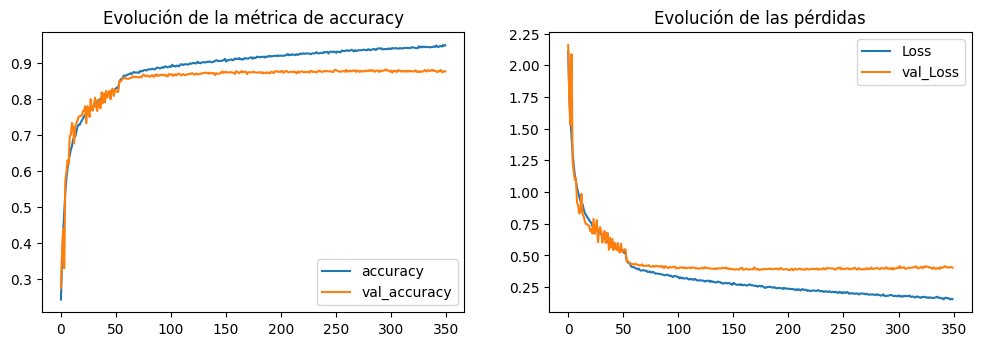

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_3_fit.history['accuracy'], label='accuracy')
plt.plot(model_3_fit.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.title('Evolución de la métrica de accuracy')

plt.subplot(2, 2, 2)
plt.plot(model_3_fit.history['loss'], label='Loss')
plt.plot(model_3_fit.history['val_loss'], label='val_Loss')
plt.legend()
plt.title('Evolución de las pérdidas')

evaluation = model_3.evaluate(x_test, y_test_c)
print(f'Accuracy obtenido en el conjunto de test : {evaluation[1] * 100:.2f}%')

Como se puede observar, el overfitting tan pronunciado de redes anteriores se ha eliminado. Es verdad que no se ha logrado el objetivo de 89% de accuracy, pero se ha logrado mejorar masivamente los resultados en el conjunto de validación.

Tal vez se podría mejorar la red con un conjunto más grande de datos, con un mayor número de epochs, o añadiendo capas a la red.

<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>